In [1]:
import sys
import os
import pandas as pd
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from scipy.stats import pearsonr, spearmanr

/home/bonsai/.pyenv/versions/3.8.5/envs/wcEcoli3/lib/python3.8/site-packages/pandas/compat/__init__.py:124: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


In [3]:
Big_data_set = pd.read_csv('r\home\bonsai\wholecell3\big_dataset2.csv')
Big_data_set

,1-ACYLGLYCEROL-3-P-ACYLTRANSFER-MONOMER[i],1-PFK[c],1-PFK-MONOMER[c],2-3-DIHYDROXYBENZOATE[c],2-DEHYDROPANTOATE-REDUCT-MONOMER[c],2-ISOPROPYLMALATESYN-MONOMER[c],2-KETOGLUTARATE[c],2-OCTAPRENYL-METHOXY-BENZOQ-METH-MONOMER[c],2-OCTAPRENYLPHENOL-HYDROX-MONOMER[i],2-PG[c],...,trpT-tRNA[c],tyrT-tRNA[c],tyrU-tRNA[c],tyrV-tRNA[c],valT-tRNA[c],valU-tRNA[c],valV-tRNA[c],valW-tRNA[c],valX-tRNA[c],valY-tRNA[c]
0,123,31,1,187161,467,2518,478753,929,49,124503,...,1909,158,158,103,42,25,24,41,66,75
1,175,135,1,162844,189,2246,416551,687,42,108327,...,445,224,199,135,44,25,21,36,60,71
2,138,138,0,170963,331,2544,437318,1093,78,113727,...,1722,257,264,159,43,27,22,40,65,71
3,271,47,0,173654,379,2183,444202,1040,67,115518,...,1782,341,321,205,29,21,16,28,48,53
4,252,31,1,164776,204,1931,421492,1022,45,109612,...,1488,167,151,103,48,29,28,49,73,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,295,33,0,156442,345,2180,400174,744,39,104068,...,862,254,215,163,29,15,18,31,43,50
2066,301,30,1,158694,253,2151,405935,884,44,105566,...,1455,266,248,177,35,18,25,32,56,59
2067,169,45,1,166769,464,2165,426590,827,84,110938,...,1568,93,94,63,37,20,18,31,48,57
2068,159,29,0,155652,311,1942,398153,986,90,103543,...,629,428,387,258,34,18,18,31,47,53


In [5]:
#define function to calculate cv
cv = lambda x: np.std(x, ddof=1) / np.mean(x) * 100 

In [6]:
#calculate CV for each column in data frame
cv1 = Big_data_set.apply(cv)
cv1

1-ACYLGLYCEROL-3-P-ACYLTRANSFER-MONOMER[i]    30.953161
1-PFK[c]                                      52.198469
1-PFK-MONOMER[c]                              99.557268
2-3-DIHYDROXYBENZOATE[c]                       7.528936
2-DEHYDROPANTOATE-REDUCT-MONOMER[c]           35.834736
                                                ...    
valU-tRNA[c]                                  20.208300
valV-tRNA[c]                                  18.895826
valW-tRNA[c]                                  18.741440
valX-tRNA[c]                                  17.413411
valY-tRNA[c]                                  17.493842
Length: 5556, dtype: float64

In [23]:
cv.sort_values(ascending=False).head(50)

FDNG-MONOMER[p]                          4549.725266
E1O[c]                                   4549.725266
FORMATEDEHYDROGN-CPLX[i]                 4549.725266
MONOMER0-5[i]                            3596.352067
YBBP-MONOMER[i]                          2211.191115
XANTHOSINEPHOSPHORY-CPLX[c]              1595.145790
G6529-MONOMER[i]                         1583.657421
CPLX0-7697[c]                            1012.869995
PHOR-CPLX[c]                             1012.667472
PHOSPHO-PHOB[c]                           990.455076
EMRB-MONOMER[i]                           988.021191
G7480-MONOMER[c]                          943.626070
MONOMER0-4444[c]                          923.532368
MONOMER0-4451[c]                          904.652066
CPLX0-8538[c]                             898.211204
CPLX0-7836[c]                             890.872498
MONOMER0-4449[c]                          870.076079
YLIC-MONOMER[i]                           855.144150
HRSA-MONOMER[i]                           828.

In [13]:
cv.sort_values(ascending=True).head(50)

charged-valU-tRNA[c]    6.814908
charged-lysT-tRNA[c]    6.839471
charged-alaW-tRNA[c]    6.860960
RNA0-312[c]             6.909922
charged-thrW-tRNA[c]    6.950882
RNA0-309[c]             6.952988
charged-serV-tRNA[c]    6.989138
RNA0-323[c]             6.995495
charged-alaV-tRNA[c]    7.016726
charged-glnU-tRNA[c]    7.038155
RNA0-319[c]             7.040123
charged-glnV-tRNA[c]    7.053057
charged-leuW-tRNA[c]    7.058477
charged-ileV-tRNA[c]    7.071468
charged-metT-tRNA[c]    7.073701
charged-alaX-tRNA[c]    7.074897
charged-glnW-tRNA[c]    7.076812
charged-gltW-tRNA[c]    7.082179
charged-lysW-tRNA[c]    7.120305
charged-valX-tRNA[c]    7.139865
charged-proL-tRNA[c]    7.155473
charged-asnT-tRNA[c]    7.155767
charged-metU-tRNA[c]    7.161837
charged-argZ-tRNA[c]    7.165116
charged-argW-tRNA[c]    7.176245
charged-argY-tRNA[c]    7.179773
charged-serU-tRNA[c]    7.183262
charged-argU-tRNA[c]    7.192775
charged-serX-tRNA[c]    7.201176
charged-glnX-tRNA[c]    7.220352
RNA0-311[c

In [3]:
max_variances = Big_data_set.var()
max_variances.sort_values(ascending=False).head(50)

WATER[c]                          1.551178e+19
K+[c]                             7.951529e+13
glycogen-monomer[c]               3.701777e+13
CPD-12819[c]                      1.494015e+13
PUTRESCINE[c]                     1.959948e+12
GLT[c]                            1.784055e+12
GLUTATHIONE[c]                    1.174257e+12
CPD-8260[c]                       8.604008e+11
ATP[c]                            7.874106e+11
FRUCTOSE-16-DIPHOSPHATE[c]        3.448911e+11
OROTATE[c]                        2.540524e+11
UDP-N-ACETYL-D-GLUCOSAMINE[c]     2.085085e+11
UTP[c]                            1.887609e+11
TTP[c]                            1.812310e+11
GLC-6-P[c]                        1.668945e+11
MG+2[c]                           1.570715e+11
PYRUVATE[c]                       1.137394e+11
CPD0-939[c]                       1.133892e+11
FE+2[c]                           9.409623e+10
L-ASPARTATE[c]                    8.062492e+10
SPERMIDINE[c]                     8.053277e+10
GLN[c]       

In [16]:
Newset = Big_data_set.reindex(cv.sort_values(ascending=False).index, axis=1)

In [24]:
#Newset = Big_data_set.reindex(max_variances.sort_values(ascending=False).index, axis=1)
#Data_set = Newset.iloc[:, : 100]
#max_variances1 = Data_set.var()

,WATER[c],K+[c],glycogen-monomer[c],CPD-12819[c],PUTRESCINE[c],GLT[c],GLUTATHIONE[c],CPD-8260[c],ATP[c],FRUCTOSE-16-DIPHOSPHATE[c],...,MONOMER0-4440[c],MONOMER0-4449[c],MONOMER0-4451[c],MONOMER0-4444[c],G7480-MONOMER[c],EMRB-MONOMER[i],PHOR-CPLX[c],MONOMER0-5[i],FDNG-MONOMER[p],FORMATEDEHYDROGN-CPLX[i]
0,57968628763,131246443,89550357,56890496,20605563,18897495,15949383,13652513,13060592,8643770,...,0,0,0,0,0,0,0,0,0,0
1,50436992648,114194108,77915431,49498937,17928363,17016585,13877142,11878696,11363680,7520719,...,0,0,0,0,0,0,0,0,0,0
2,52951633162,119887491,81800066,51966809,18822219,18902269,14569016,12470933,11930240,7895680,...,0,0,0,0,0,0,0,0,0,0
3,53785103665,121774547,83087617,52784778,19118485,18999753,14798336,12667228,12118025,8019960,...,0,0,0,0,0,0,0,0,0,0
4,51035421859,115549009,78839889,50086236,18141081,17117165,14041793,12019636,11498509,7609952,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,48454134870,109704731,74852298,47552958,17223536,16511534,13331583,11411702,10916934,7225052,...,0,0,0,0,0,0,0,0,0,0
2066,49151663791,111284002,75929845,48237514,17471480,15785013,13523499,11575981,11074090,7329062,...,0,0,0,0,0,0,0,0,0,0
2067,51652608905,116946377,79793324,50691944,18360467,17688803,14211605,12164992,11637564,7701981,...,0,0,0,0,0,0,0,0,0,0
2068,48209426250,109150688,74474271,47312800,17136551,16647904,13264254,11354069,10861799,7188564,...,0,0,0,0,0,0,0,0,0,0


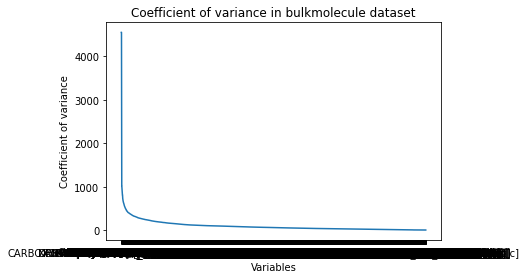

In [24]:
plt.plot(cv.sort_values(ascending=False))
plt.title('Coefficient of variance in bulkmolecule dataset')
plt.xlabel('Variables')
plt.ylabel('Coefficient of variance')
plt.show()

In [6]:
max_variances = Big_data_set.var()
max_variances.sort_values(ascending=True).head(50)

FORMATEDEHYDROGN-CPLX[i]            0.001754
PHOR-CPLX[c]                        0.010434
EMRB-MONOMER[i]                     0.010434
G7480-MONOMER[c]                    0.013862
MONOMER0-4444[c]                    0.015567
FDNG-MONOMER[p]                     0.015789
MONOMER0-4451[c]                    0.017266
MONOMER0-5[i]                       0.017525
MONOMER0-4440[c]                    0.018959
MONOMER0-4448[c]                    0.018959
MONOMER0-4449[c]                    0.020646
EG10484-MONOMER[c]                  0.025668
EG11071-MONOMER[c]                  0.028986
G6138-MONOMER[c]                    0.035547
CPLX0-2141[i]                       0.043610
MONOMER0-4446[c]                    0.046792
PD01896[c]                          0.058154
CPLX0-8167[i]                       0.072842
G7385-MONOMER[c]                    0.075405
G7777-MONOMER[c]                    0.089427
EG11088-MONOMER[c]                  0.099186
G7244-MONOMER[c]                    0.104909
ALPHA-SUBU

In [26]:
Newset = Big_data_set.reindex(cv.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, : 2000]
Data_set

,FDNG-MONOMER[p],E1O[c],FORMATEDEHYDROGN-CPLX[i],MONOMER0-5[i],YBBP-MONOMER[i],XANTHOSINEPHOSPHORY-CPLX[c],G6529-MONOMER[i],CPLX0-7697[c],PHOR-CPLX[c],PHOSPHO-PHOB[c],...,EG10686-MONOMER[i],EG12391-MONOMER[c],GUANYL-KIN-MONOMER[c],G7694-MONOMER[m],EG11134-MONOMER[c],EG11426-MONOMER[c],EG11768-MONOMER[c],G7452-MONOMER[c],CREC-MONOMER[i],EG10564-MONOMER[c]
0,0,0,0,0,0,0,8,0,0,0,...,1,1,2,32,2,20,38,3,0,1
1,0,0,0,0,0,0,0,0,0,0,...,1,2,1,25,5,20,36,0,1,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,28,1,41,58,1,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,30,1,19,41,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,1,107,3,59,19,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,0,0,0,0,0,0,0,0,0,0,...,1,1,1,204,3,18,28,1,0,1
2066,0,0,0,0,0,0,0,0,0,0,...,0,2,1,28,1,34,32,3,0,1
2067,0,0,0,0,0,0,0,0,0,0,...,1,0,0,24,1,33,60,1,1,0
2068,0,0,0,0,0,0,0,0,0,0,...,1,1,2,22,1,22,27,1,1,1


In [27]:
Newset1 = Big_data_set.reindex(cv.sort_values(ascending=True).index, axis=1)
Data_set1 = Newset1.iloc[:, : 2000]
Data_set1

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,CPLX0-7727[c],RELA-MONOMER[c],PD00369[c],L-ASPARTATE-OXID-MONOMER[c],EG11853-MONOMER[c],CPLX0-8027[c],MONOMER0-1603[m],charged-cysT-tRNA[c],EG12221-MONOMER[c],CPLX0-7975[i]
0,2296,3030,2704,8799,5813,4484,8810,6897,6569,3098,...,234,227,133,749,280,14,426,5252,110,50
1,1939,2621,2276,7732,5061,3850,7872,5906,5715,2783,...,157,100,49,254,514,6,180,31,144,28
2,1979,2775,2407,7996,5327,4120,7989,6317,6205,2680,...,177,242,141,681,637,8,448,4668,105,21
3,2116,2827,2467,8058,5405,4081,8306,6334,6241,2894,...,112,180,45,591,294,9,165,4780,179,33
4,2006,2673,2423,7974,5213,3865,7875,6297,5813,2768,...,125,155,101,613,188,11,230,4630,75,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,1899,2568,2334,7538,4873,3727,7512,5711,5720,2637,...,115,281,71,210,272,5,320,33,209,24
2066,1936,2605,2261,7703,5029,3825,7594,5807,5634,2654,...,95,91,96,578,281,6,279,4692,345,38
2067,2069,2796,2446,7954,5119,3840,7946,6076,5965,2813,...,123,83,158,510,232,8,284,5040,92,36
2068,1938,2604,2358,7513,4937,3736,7460,5735,5684,2663,...,117,98,83,701,166,9,158,31,226,36


In [29]:
Data_set1.to_csv('r\home\bonsai\wholecell3\cvlowdataset.csv', index = False)

In [30]:
Data_set.to_csv('r\home\bonsai\wholecell3\cvhighdataset.csv', index = False)

In [41]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, : 100]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

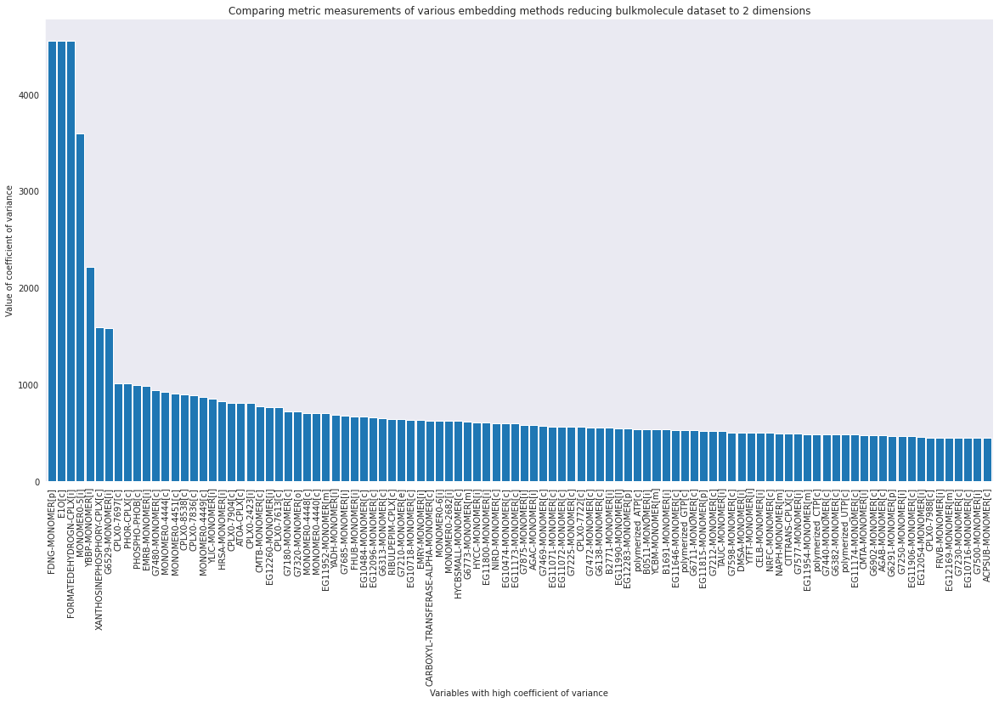

In [43]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [45]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 100:200]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

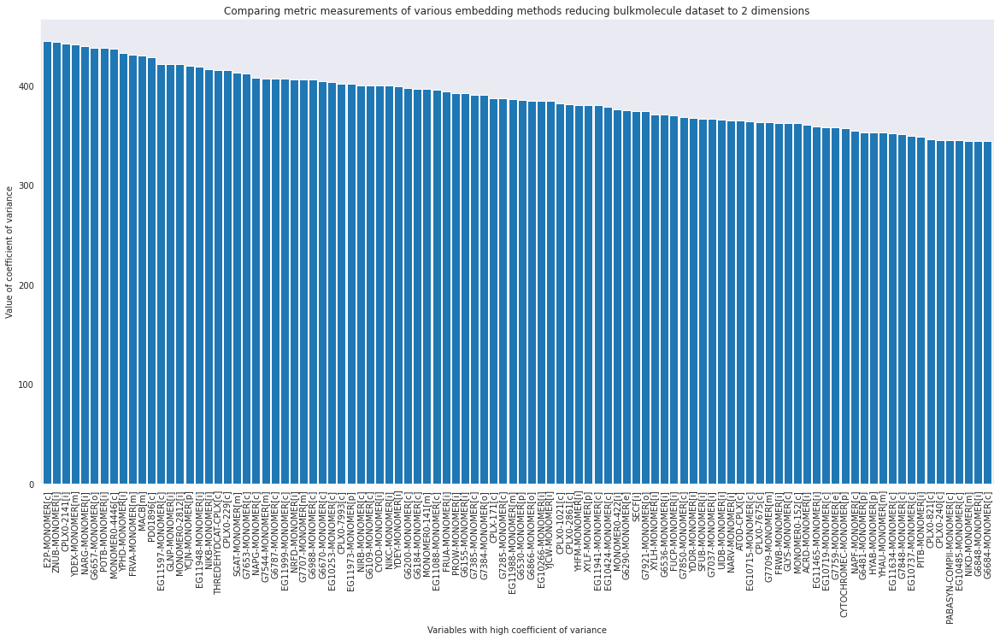

In [46]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [47]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 200:300]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

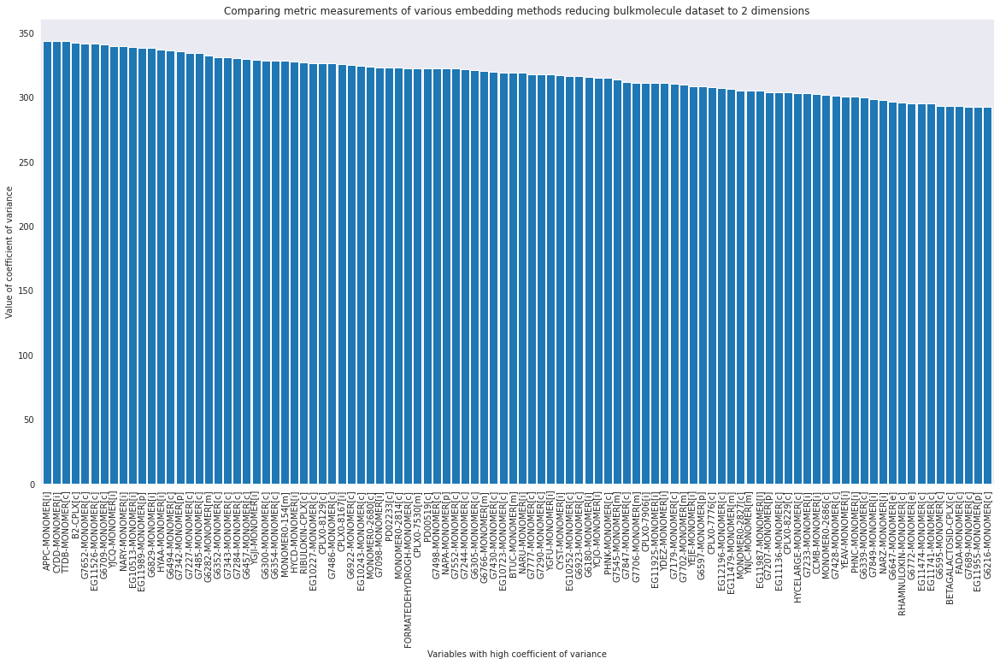

In [48]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [49]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 300:400]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

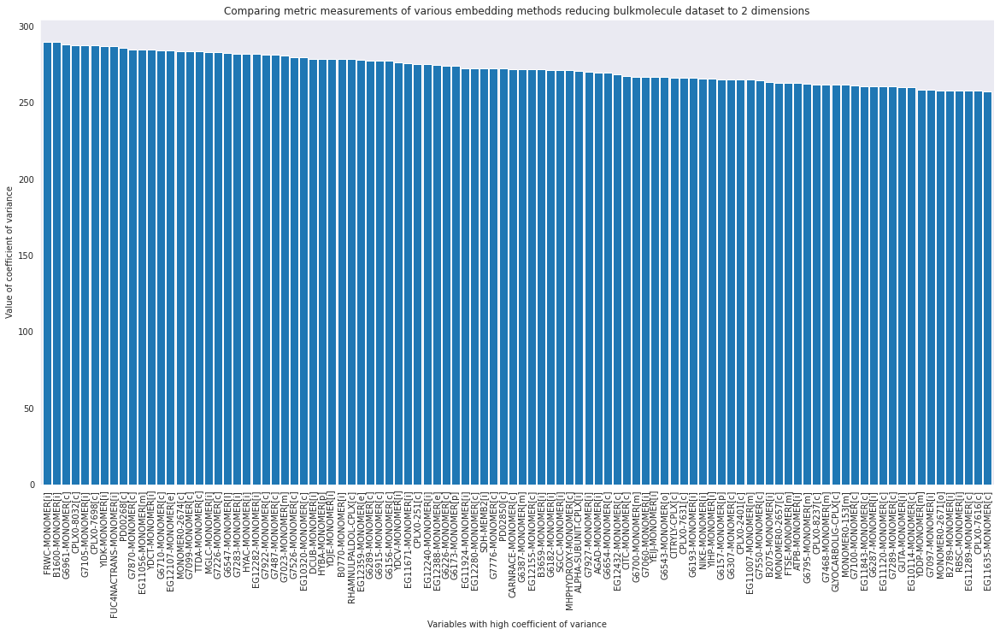

In [50]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [51]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 400:500]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

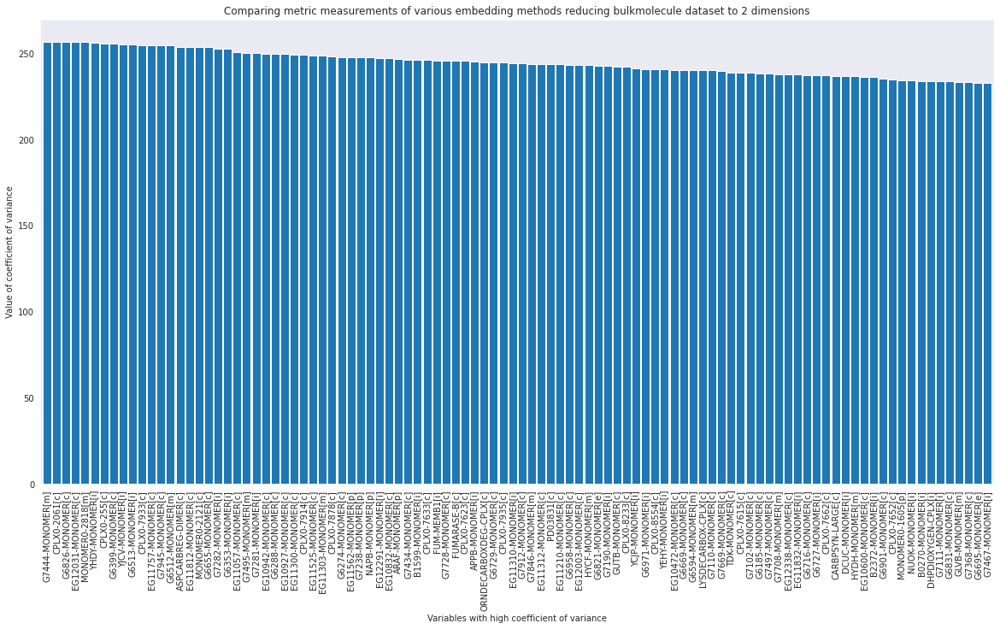

In [52]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [53]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 500:600]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

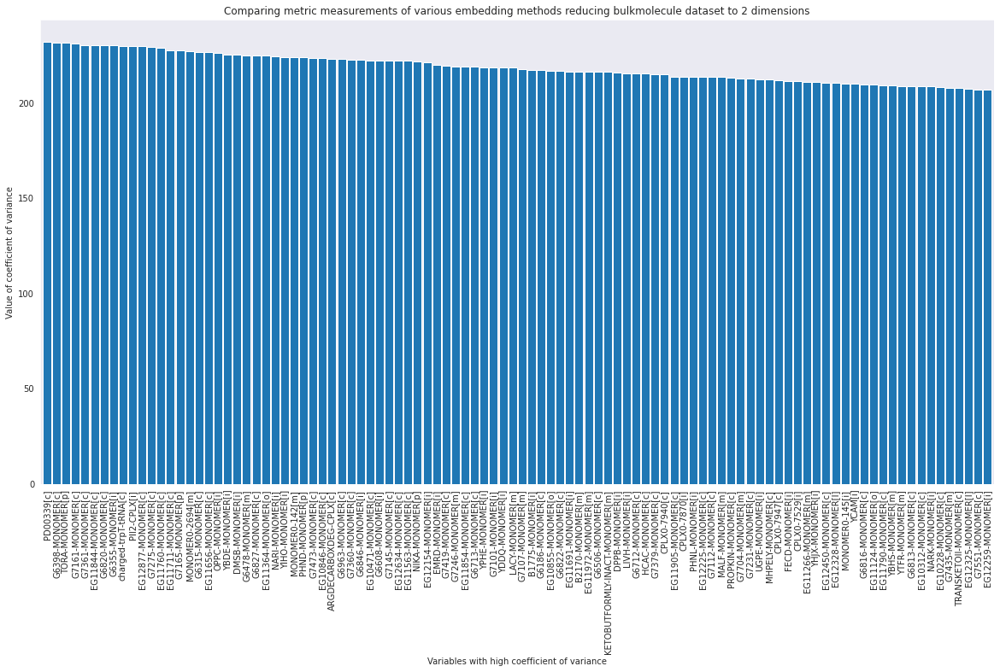

In [54]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [55]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 600:700]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

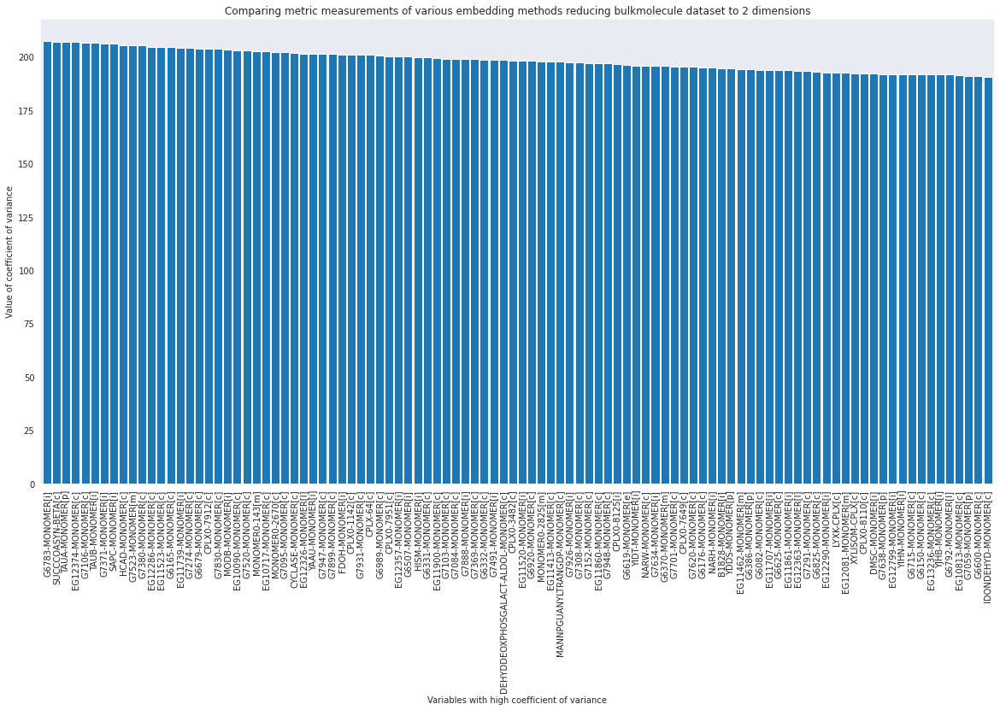

In [56]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [57]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 700:800]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

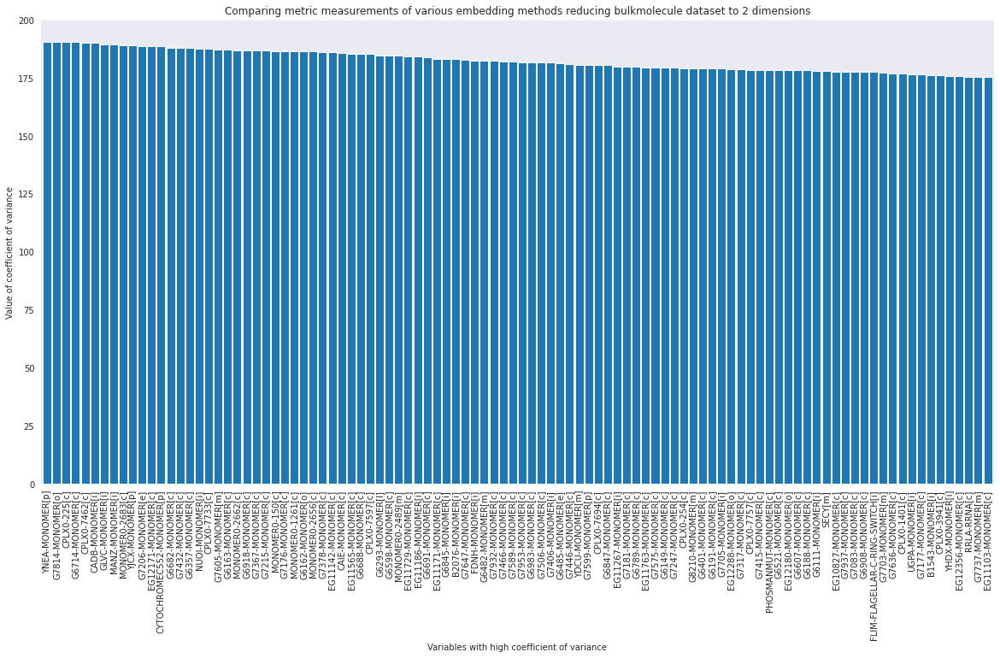

In [58]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [59]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 800:900]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

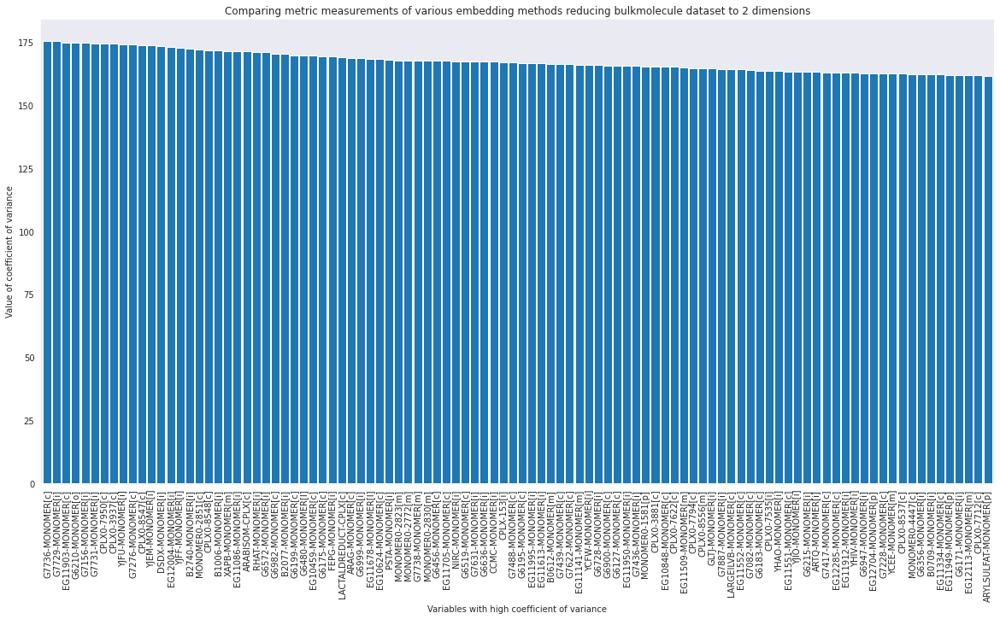

In [60]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [61]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 900:1000]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

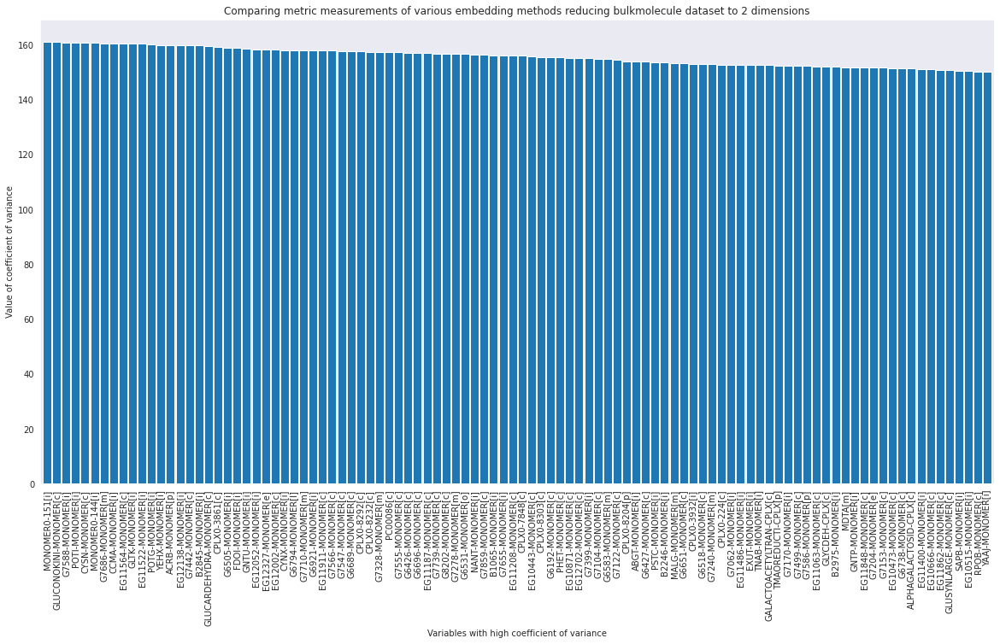

In [62]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [63]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1000:1100]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

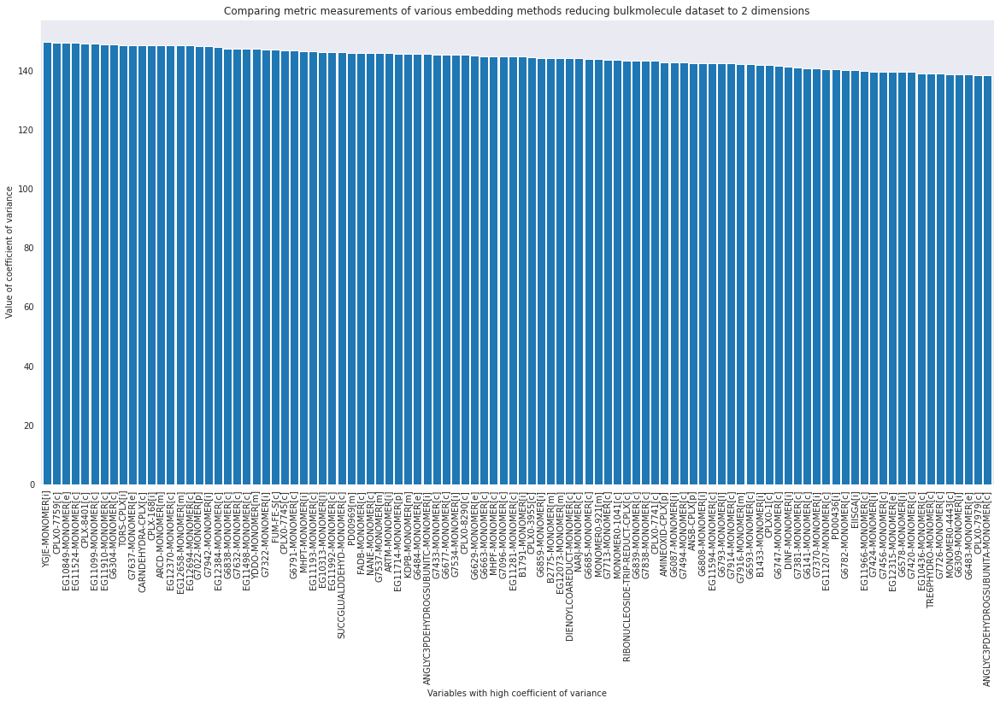

In [64]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [65]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1100:1200]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

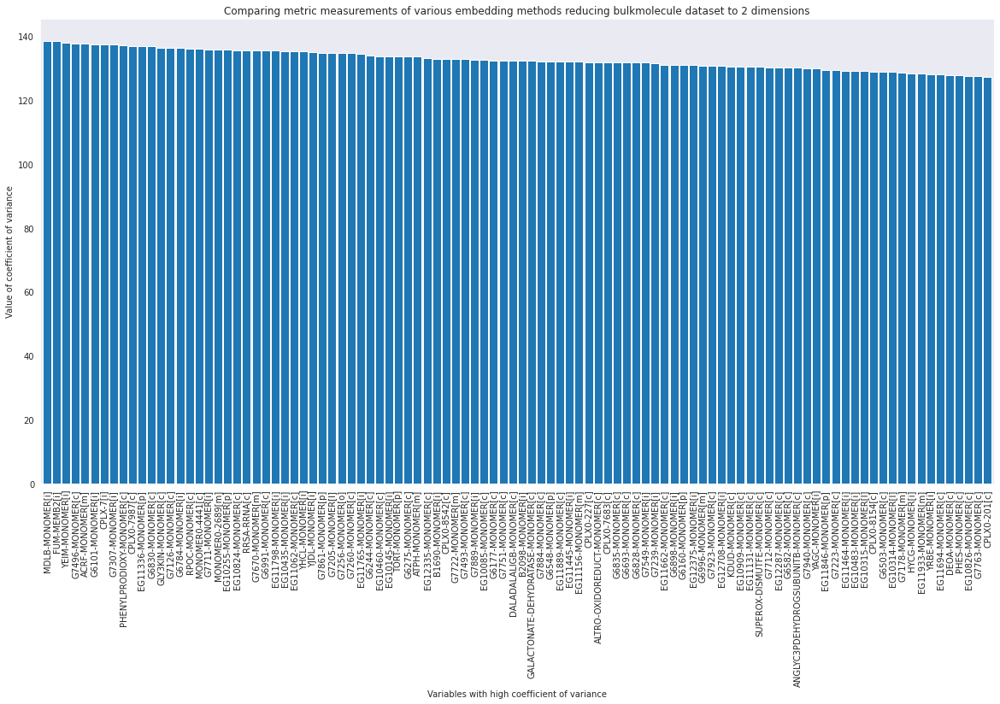

In [66]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [67]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1200:1300]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

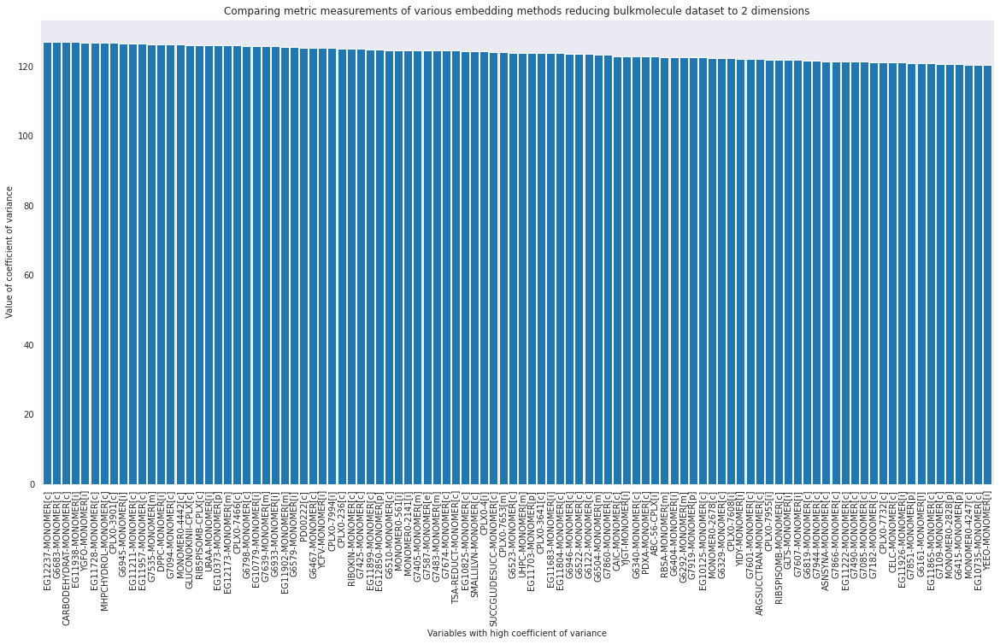

In [68]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [71]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1300:1400]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

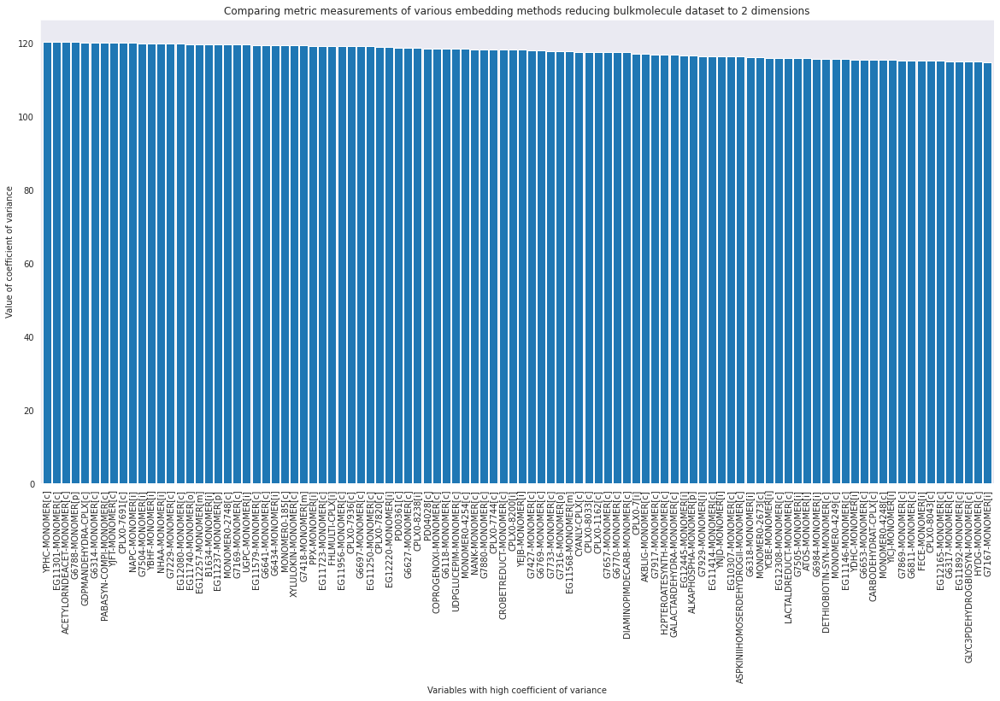

In [72]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [73]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1400:1500]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

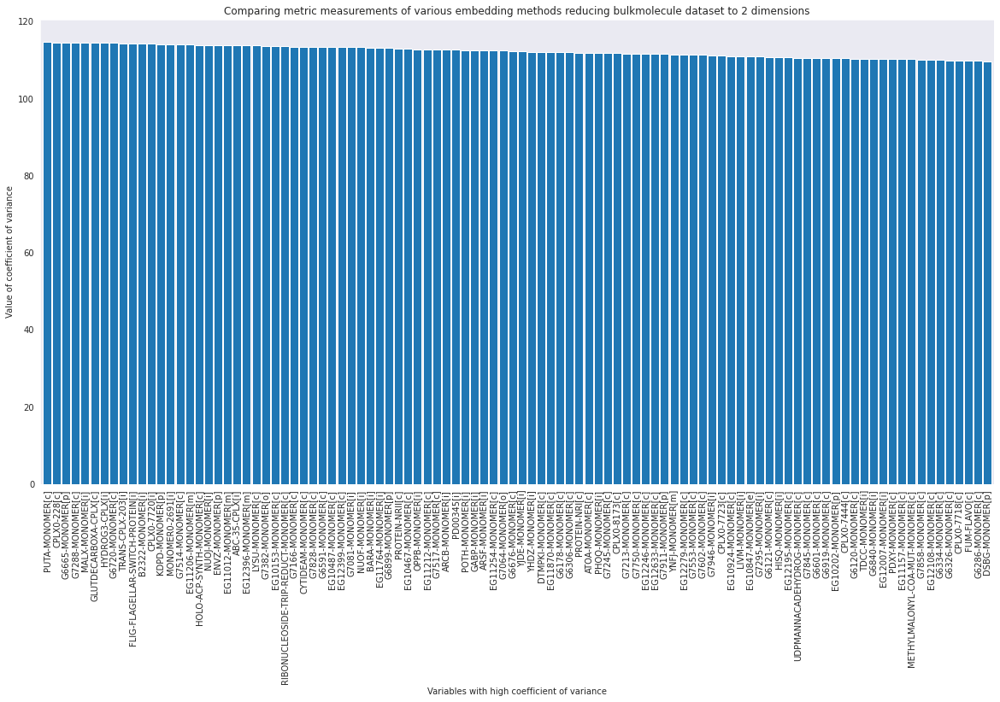

In [74]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [146]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1500:1600]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

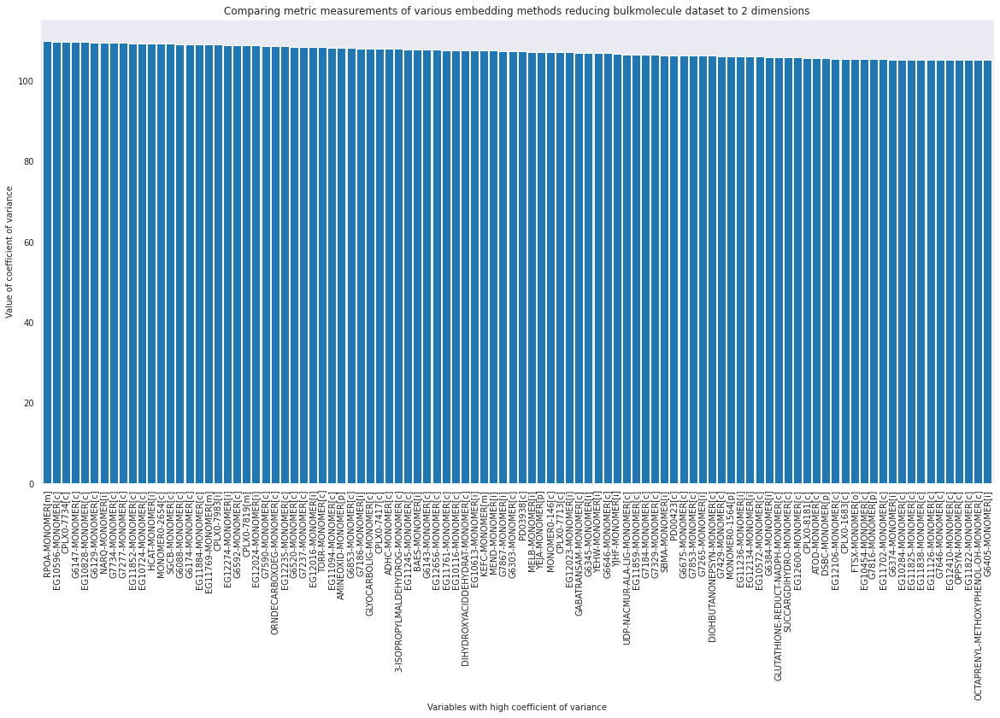

In [147]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [148]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1600:1700]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

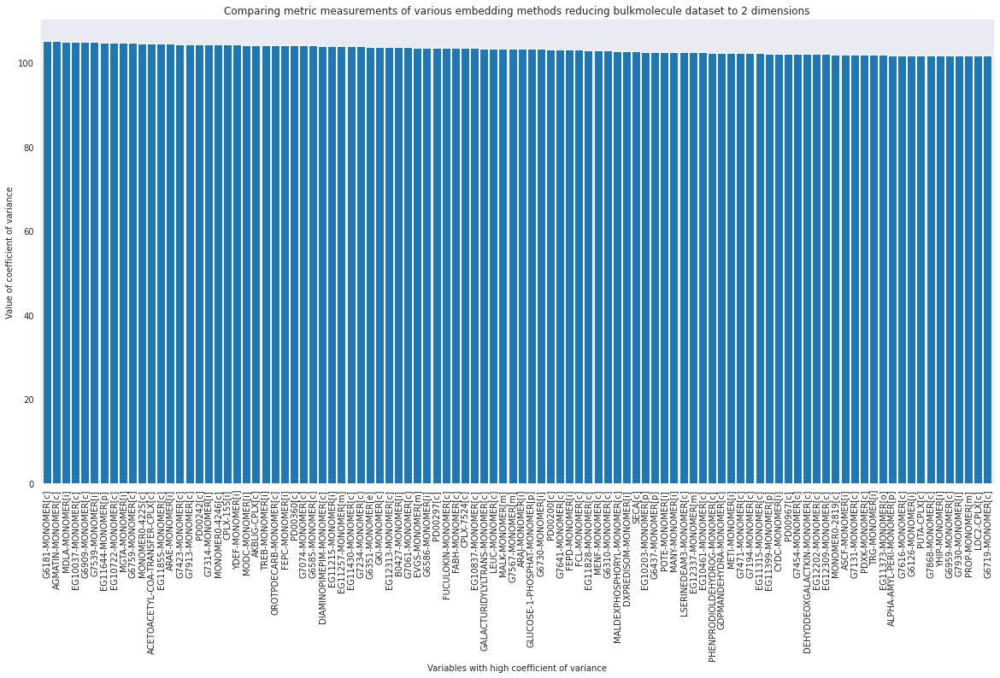

In [149]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [150]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1700:1800]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

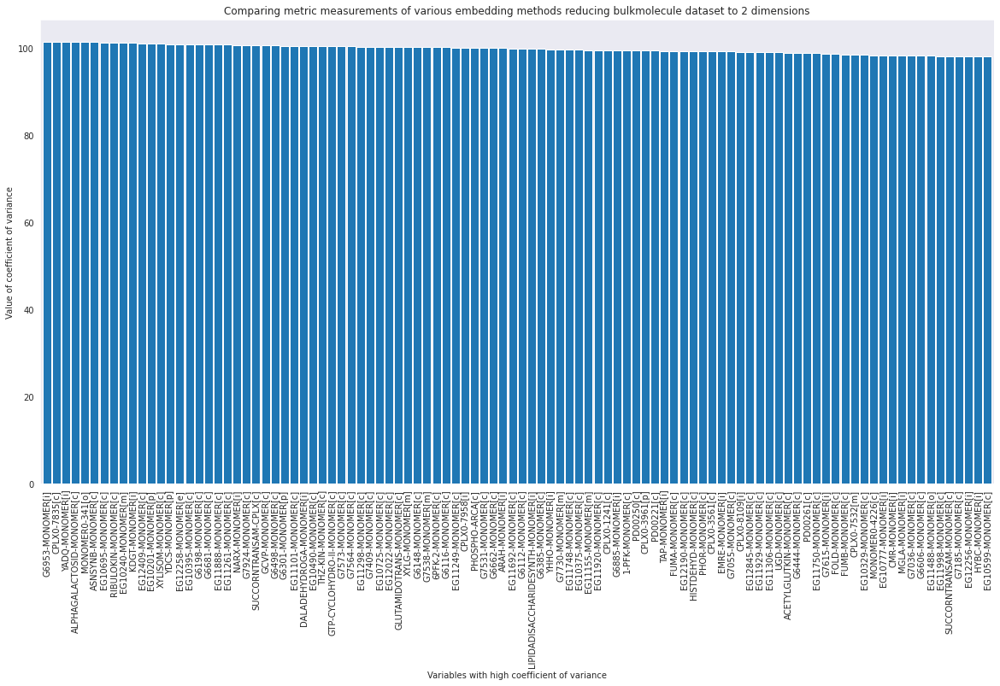

In [151]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [152]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1800:1900]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

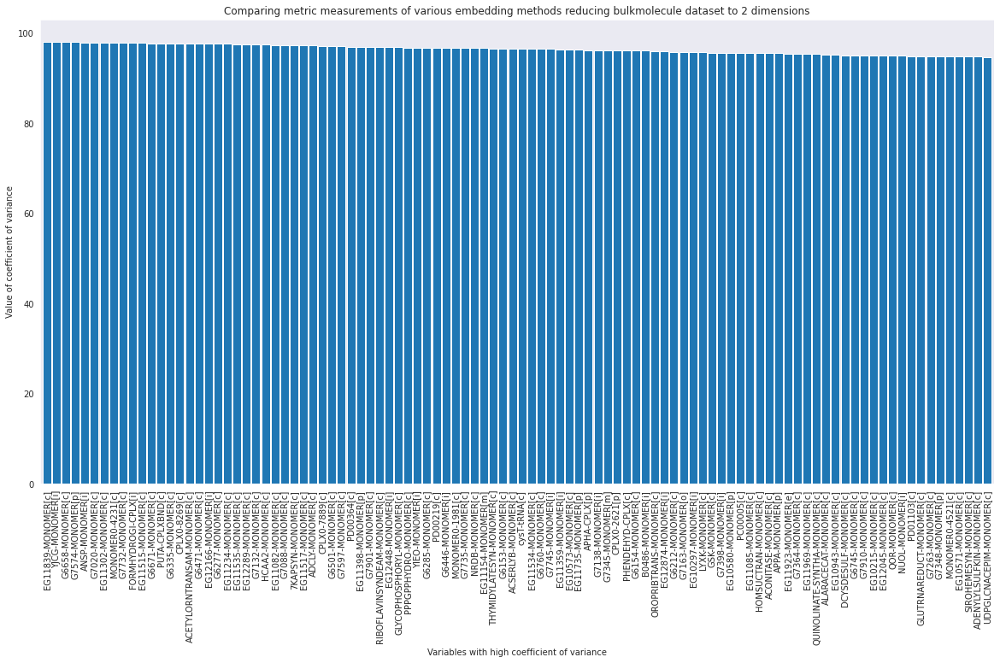

In [153]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [154]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1900:2000]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

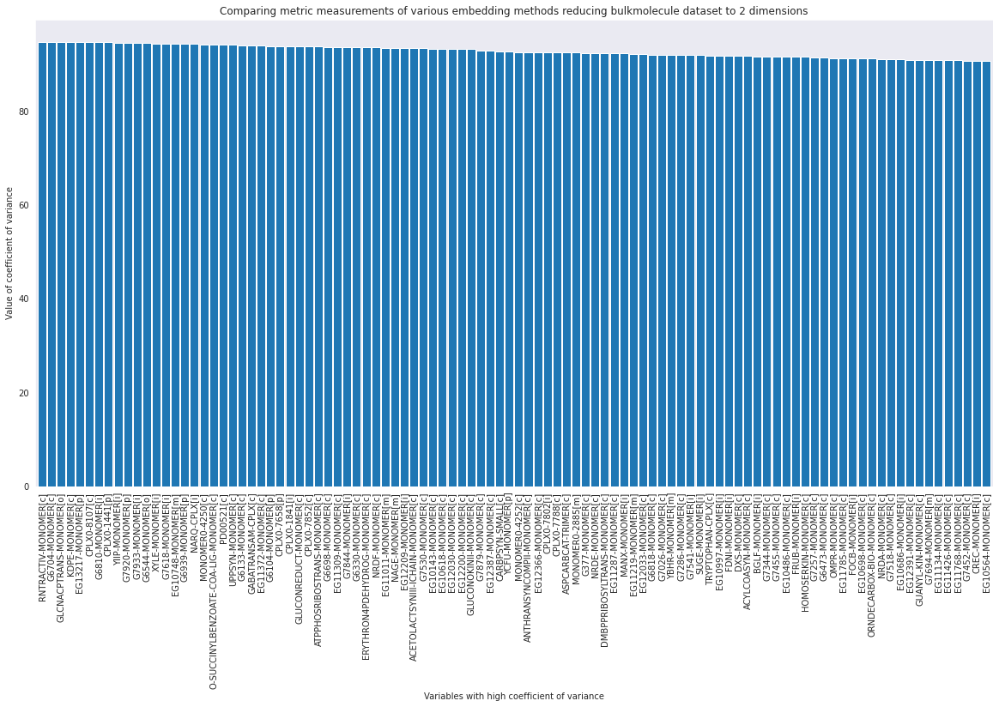

In [155]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [156]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2000:2100]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

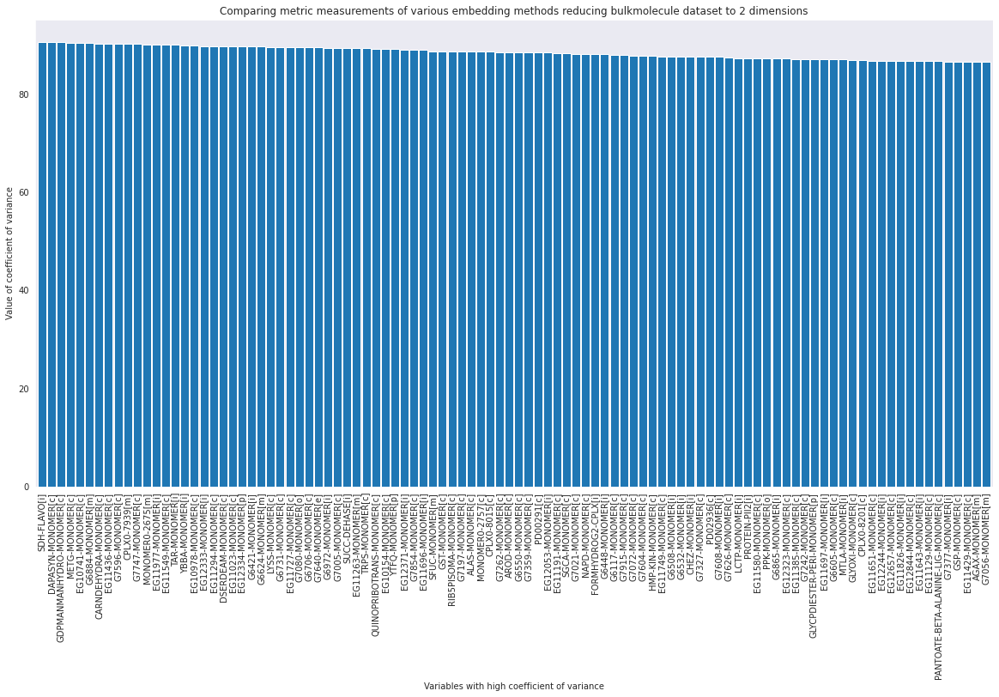

In [157]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [158]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2100:2200]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

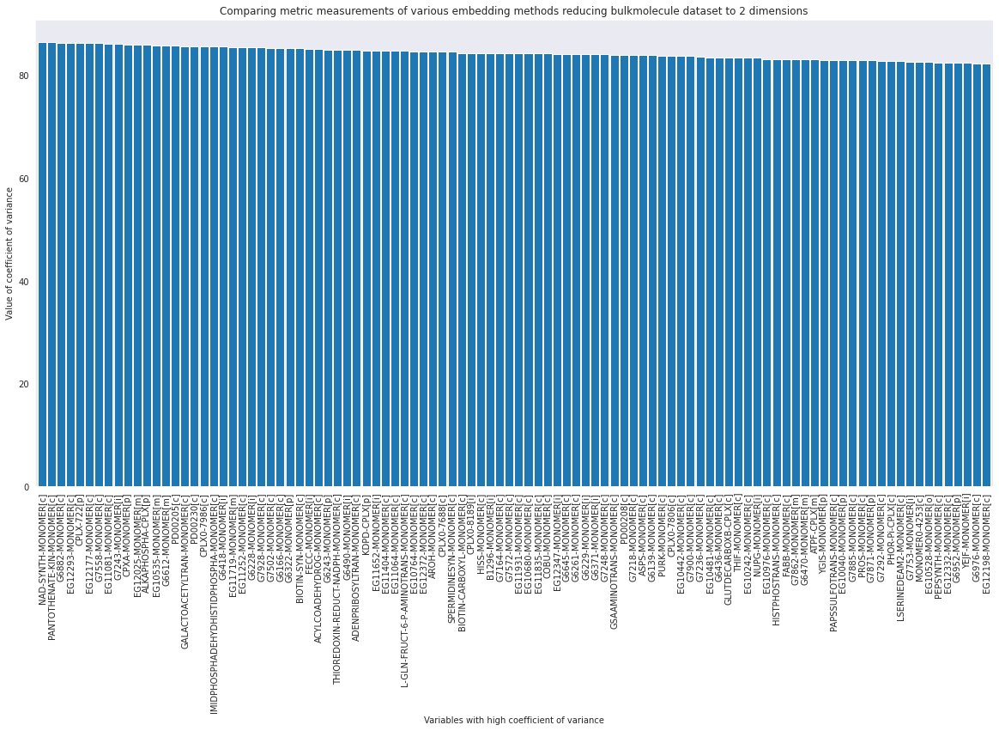

In [159]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [160]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2200:2300]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

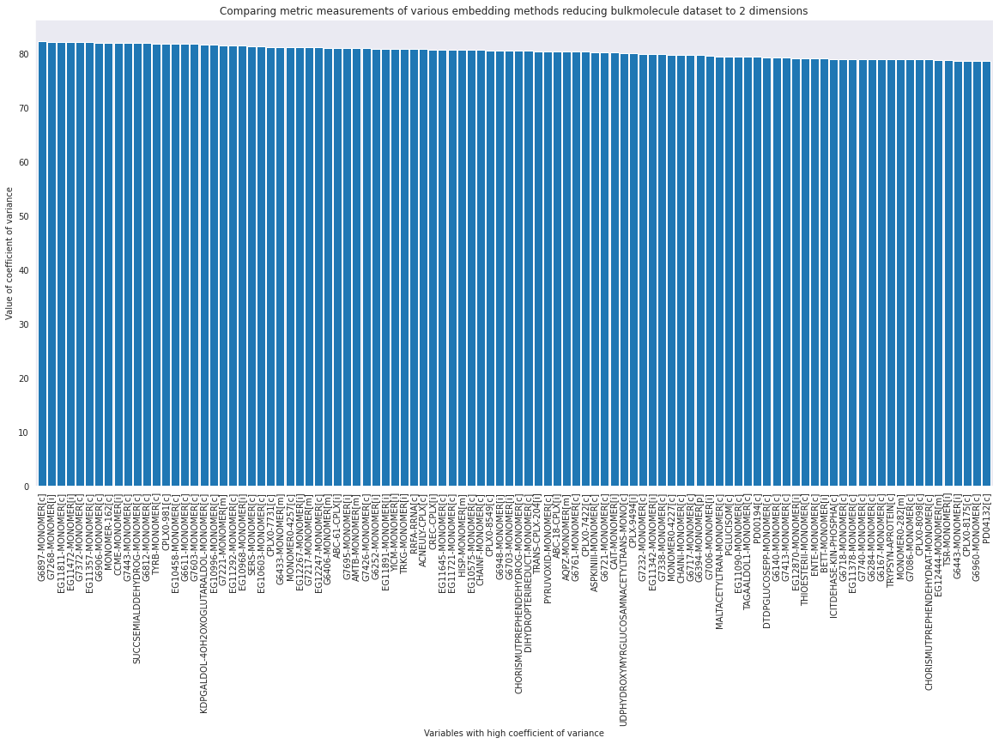

In [161]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [162]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2300:2400]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

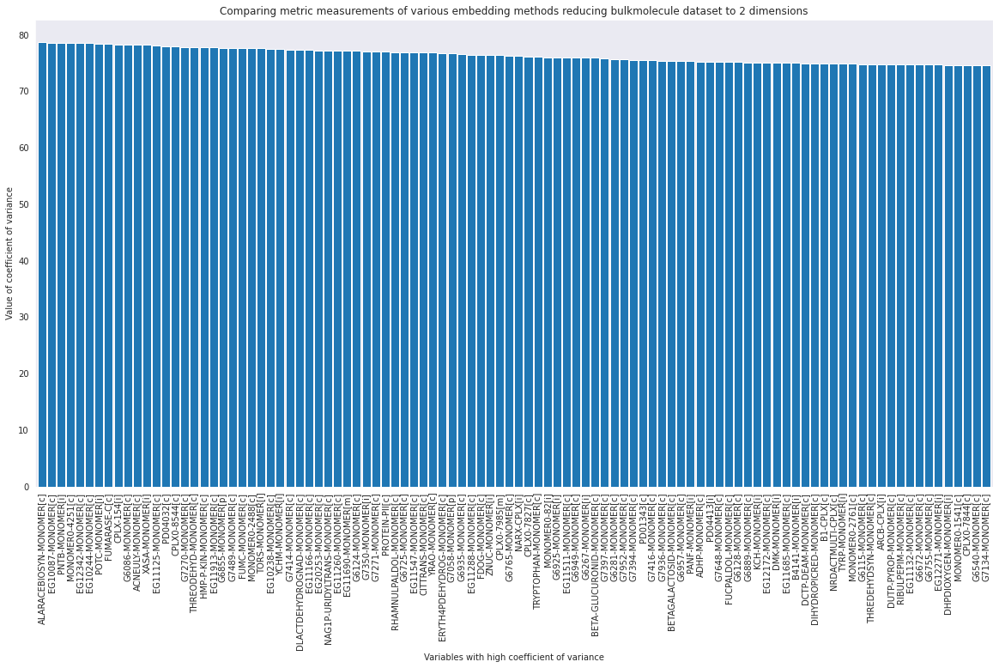

In [163]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [164]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2400:2500]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

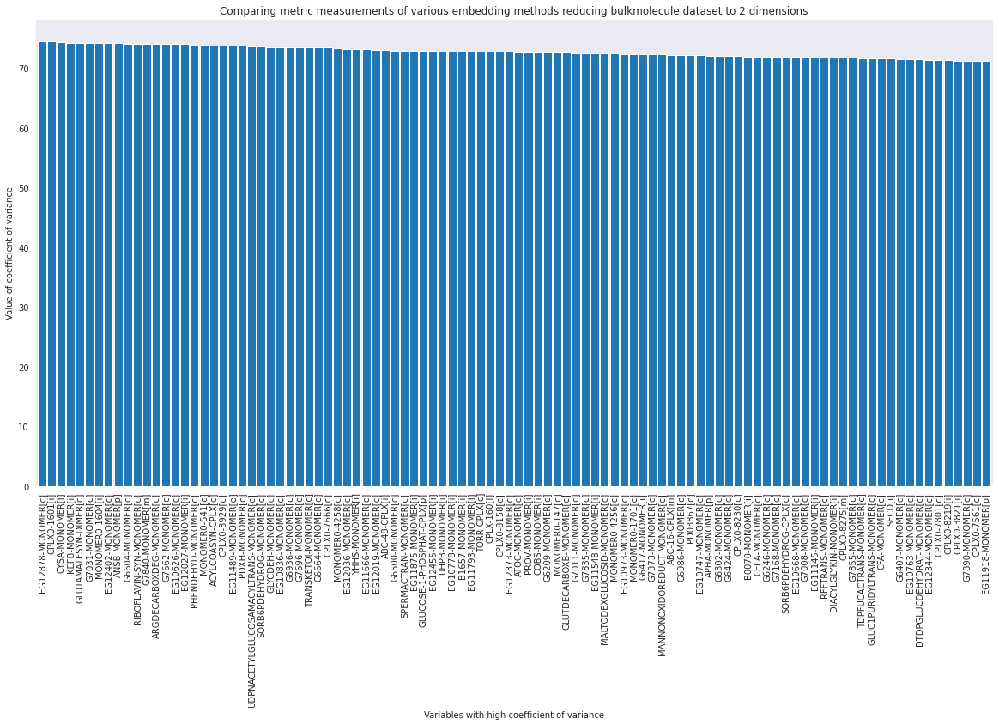

In [165]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [166]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2500:2600]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

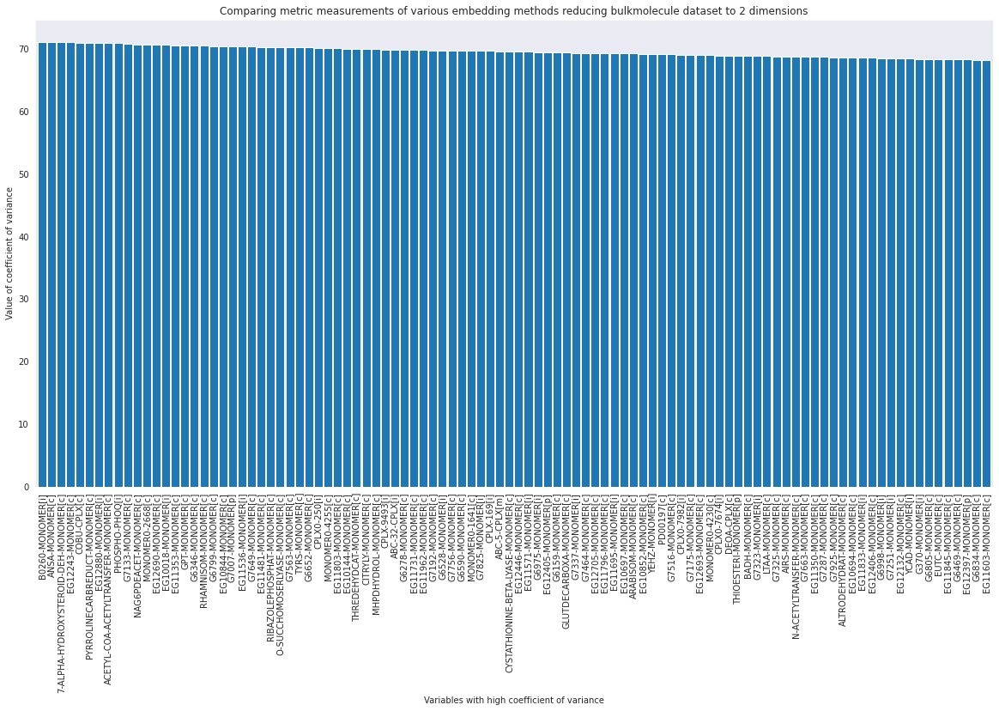

In [167]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [168]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2600:2700]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

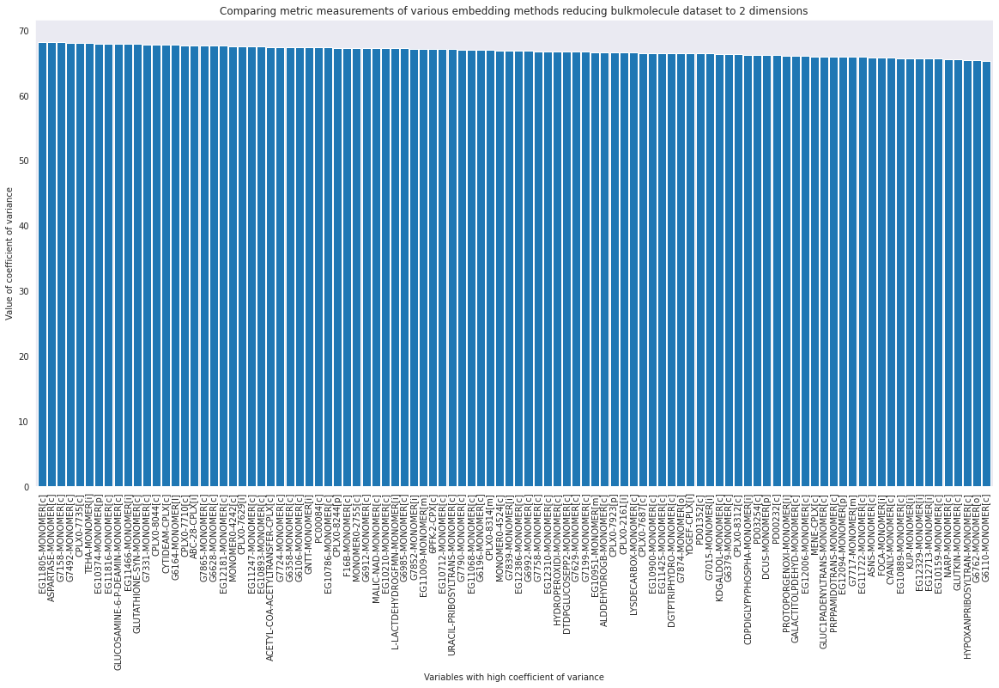

In [169]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [170]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2700:2800]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

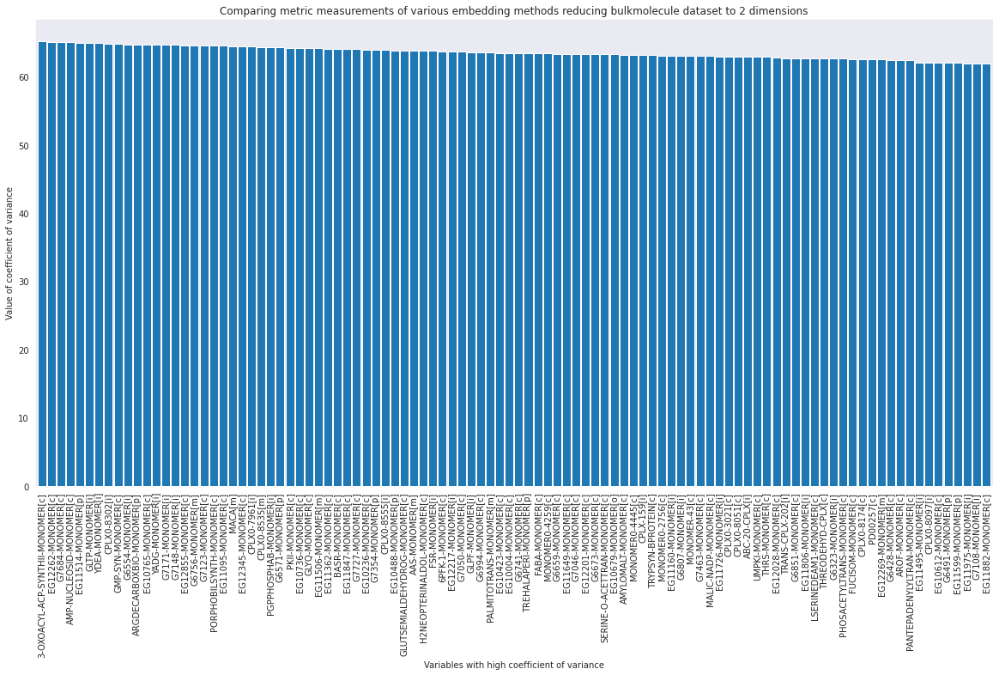

In [171]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [172]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2800:2900]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

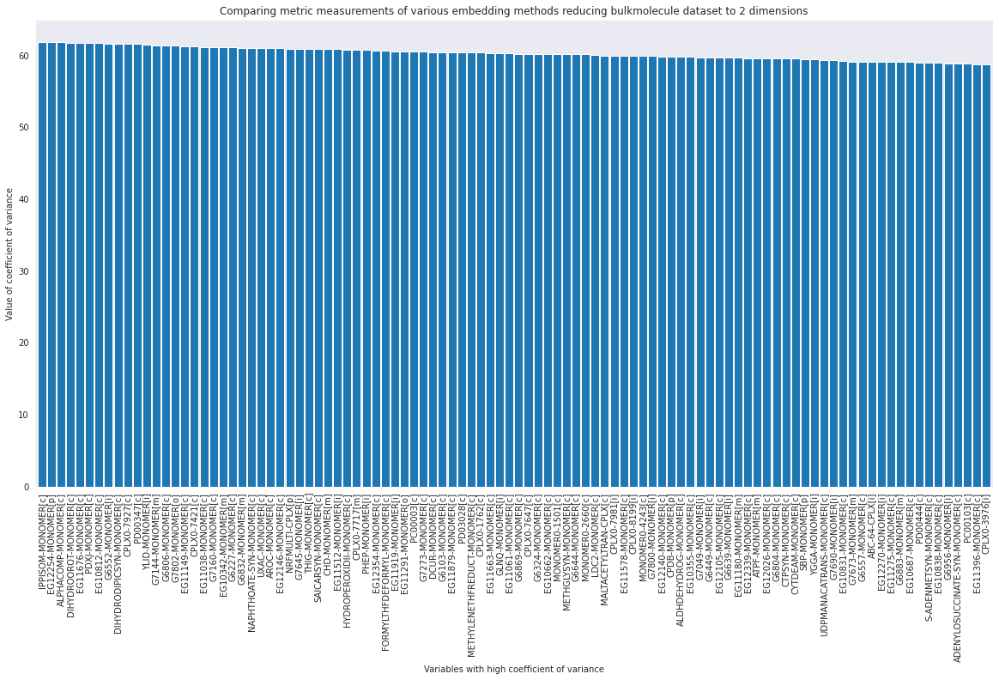

In [173]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [174]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 2900:3000]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

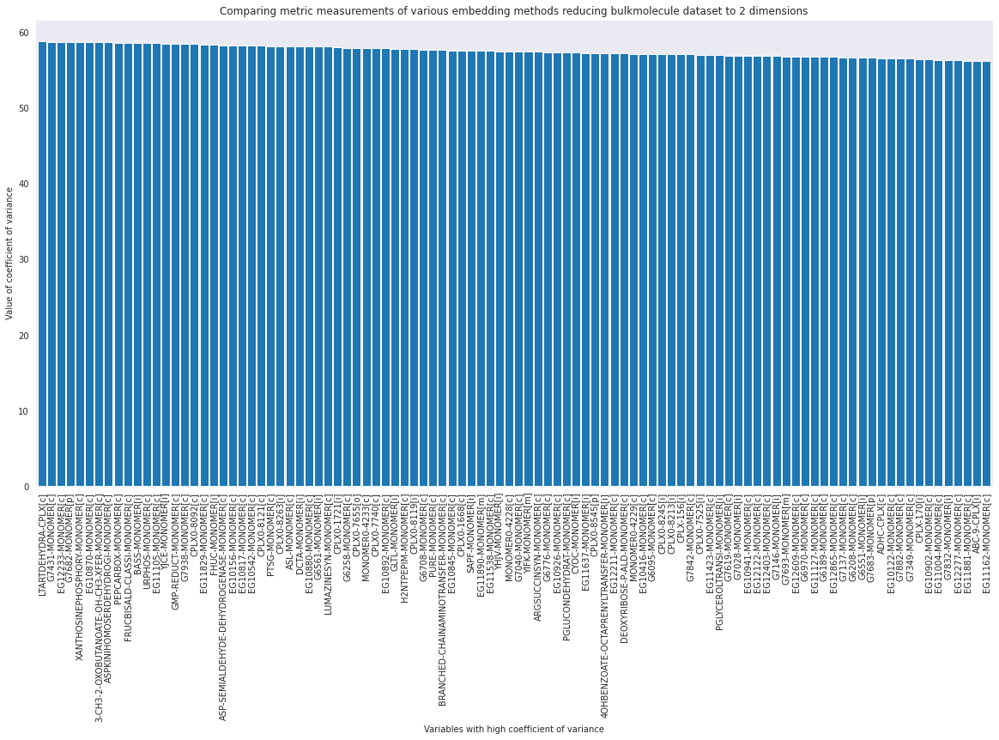

In [175]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [176]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3000:3100]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

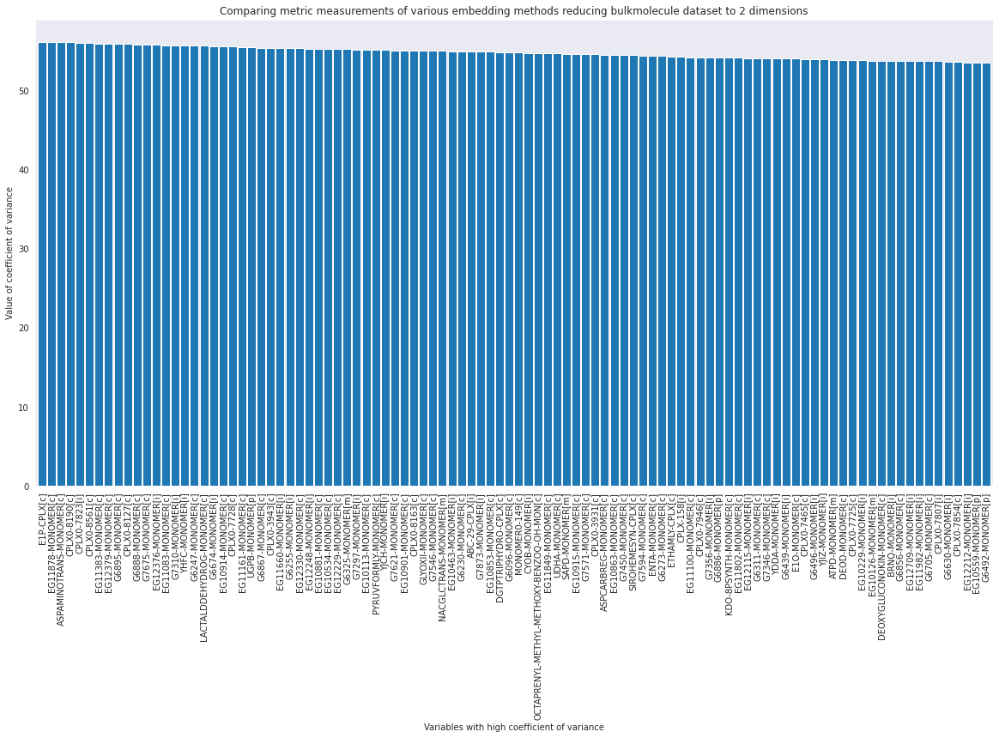

In [177]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [178]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3100:3200]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

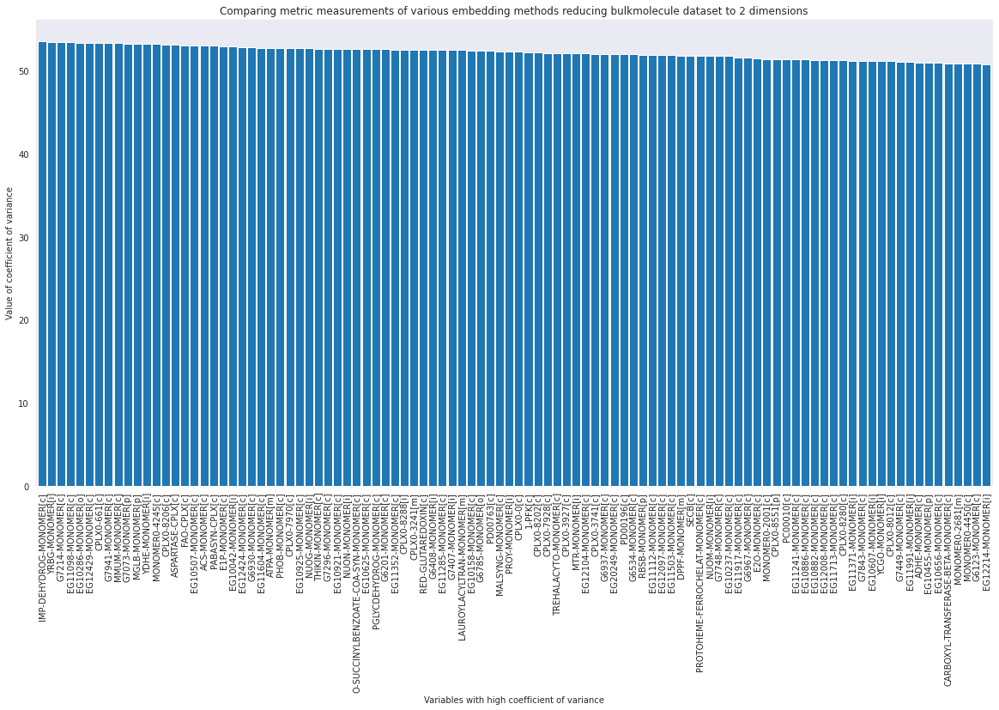

In [179]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [180]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3200:3300]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

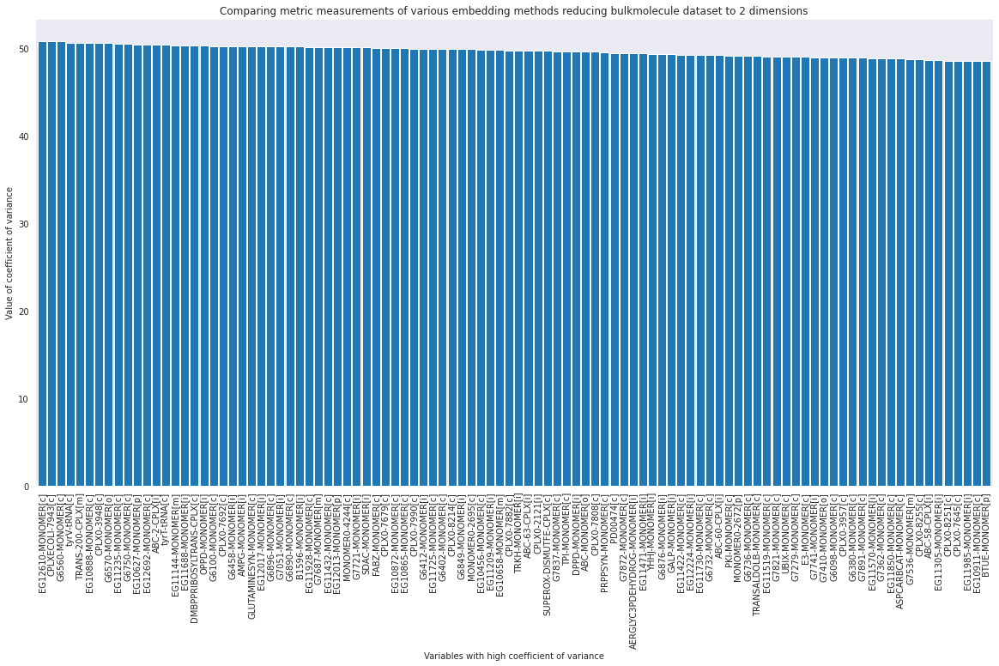

In [181]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [182]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3300:3400]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

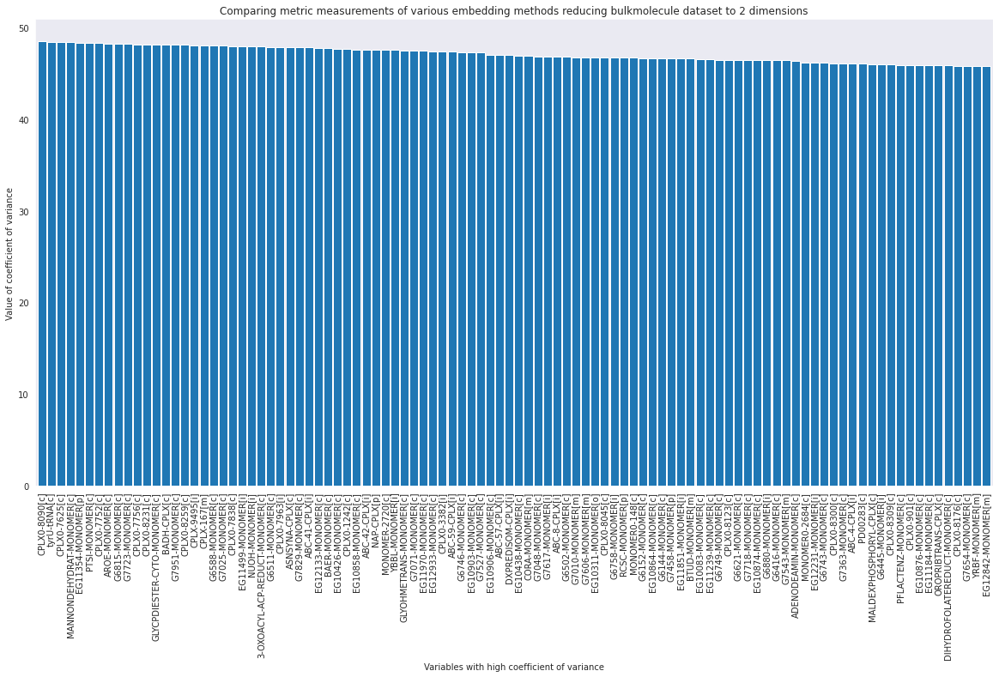

In [183]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [184]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3400:3500]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

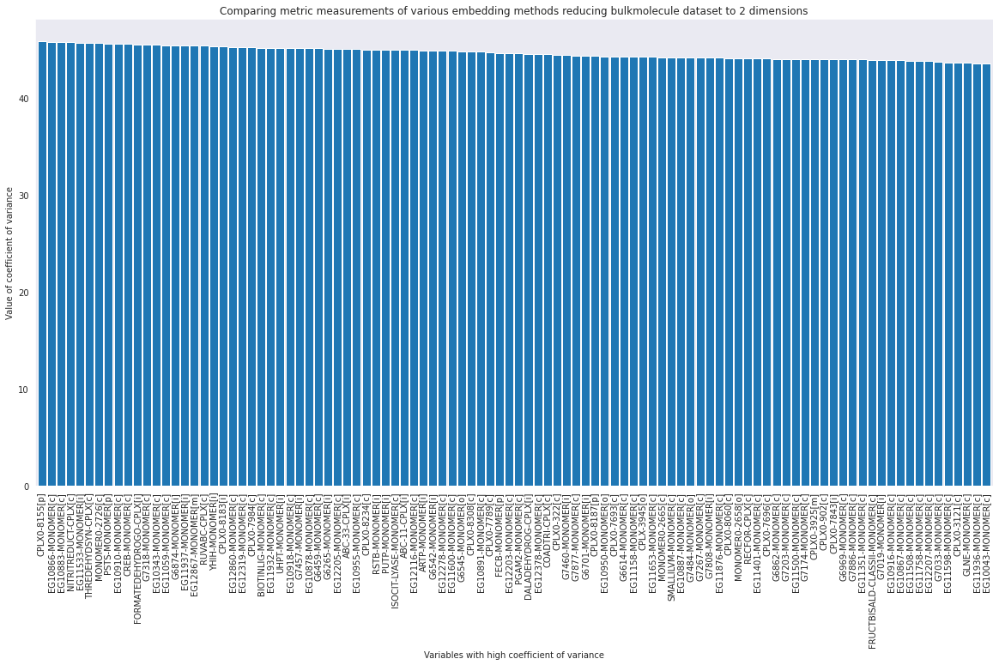

In [185]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [186]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3500:3600]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

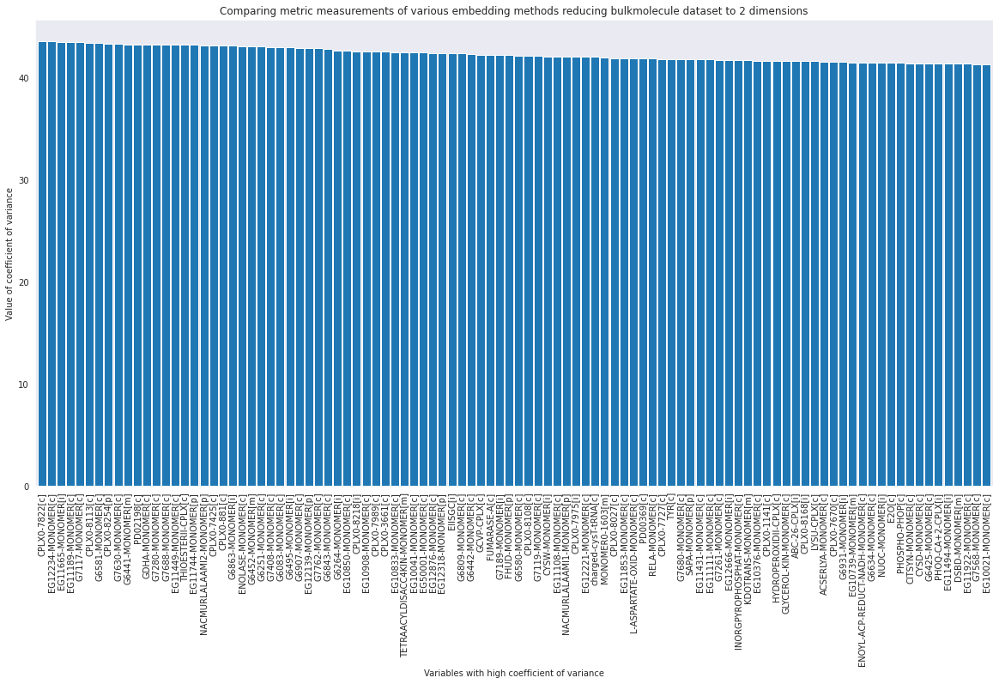

In [187]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [188]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3600:3700]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

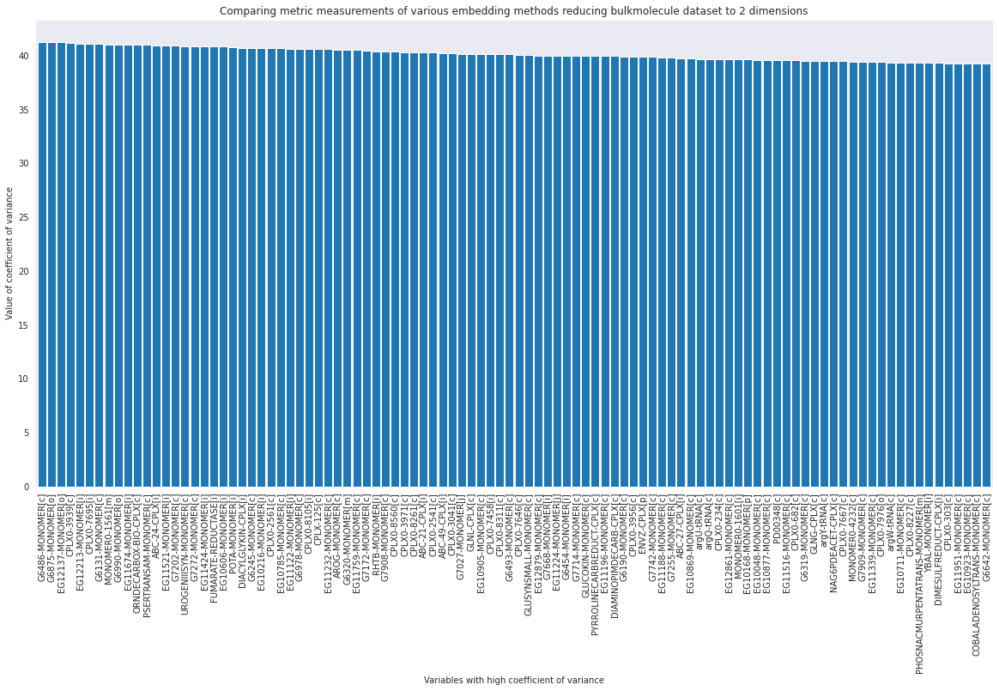

In [189]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [190]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3700:3800]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

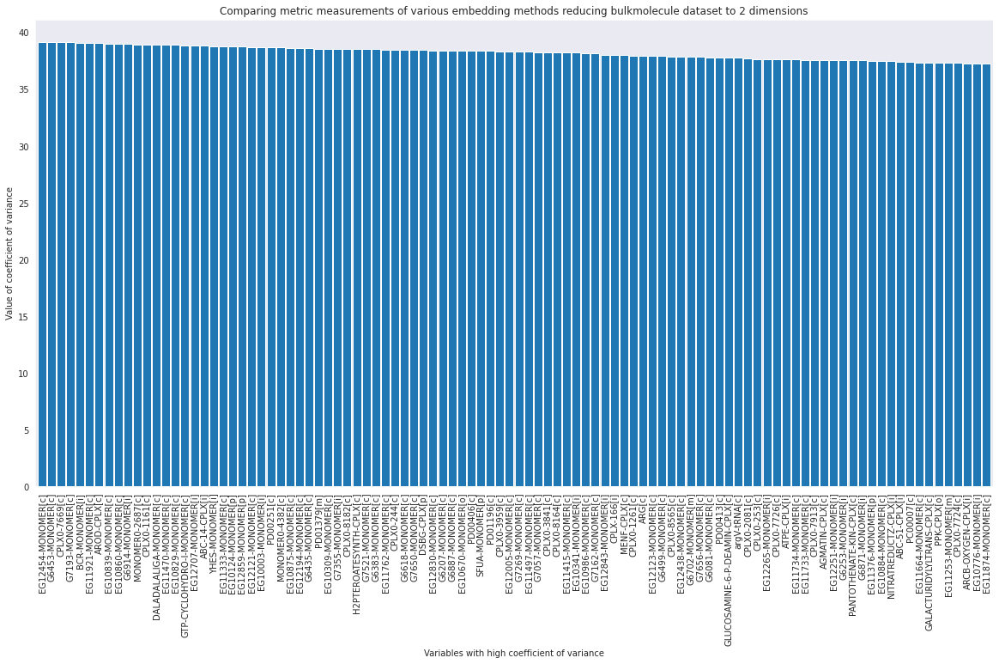

In [191]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [192]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3800:3900]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

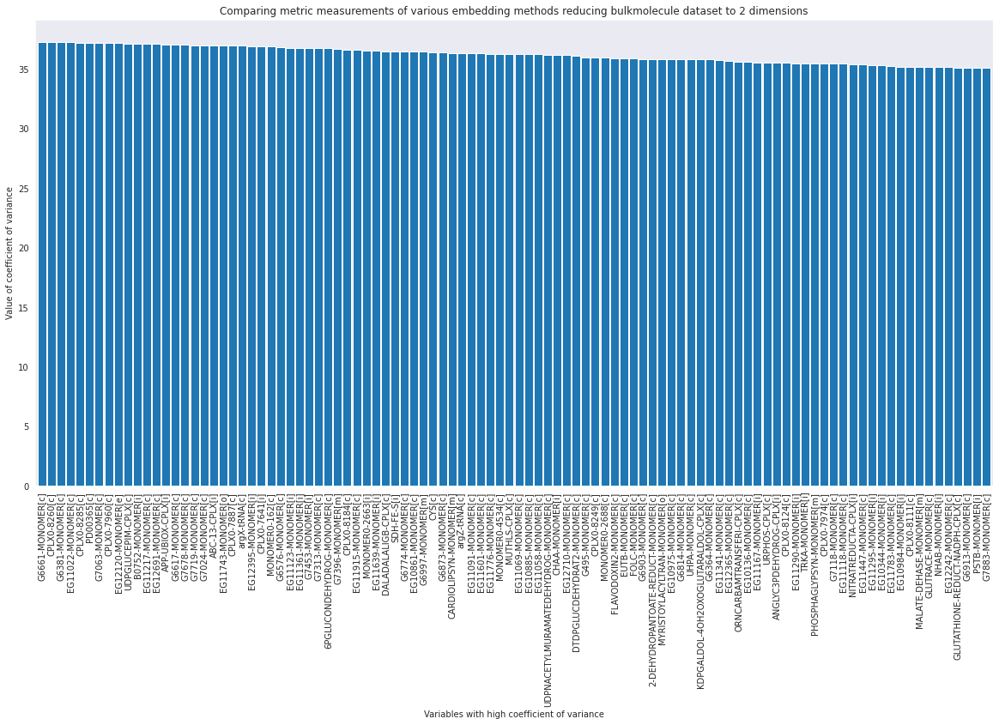

In [193]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [194]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 3900:4000]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

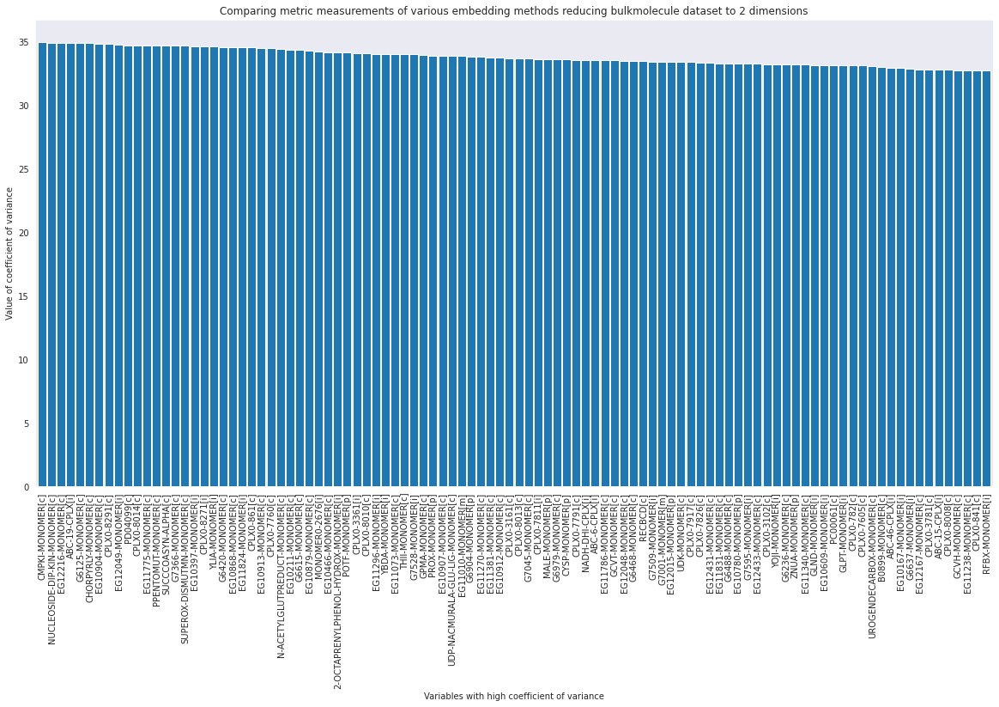

In [195]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [196]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4100:4200]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

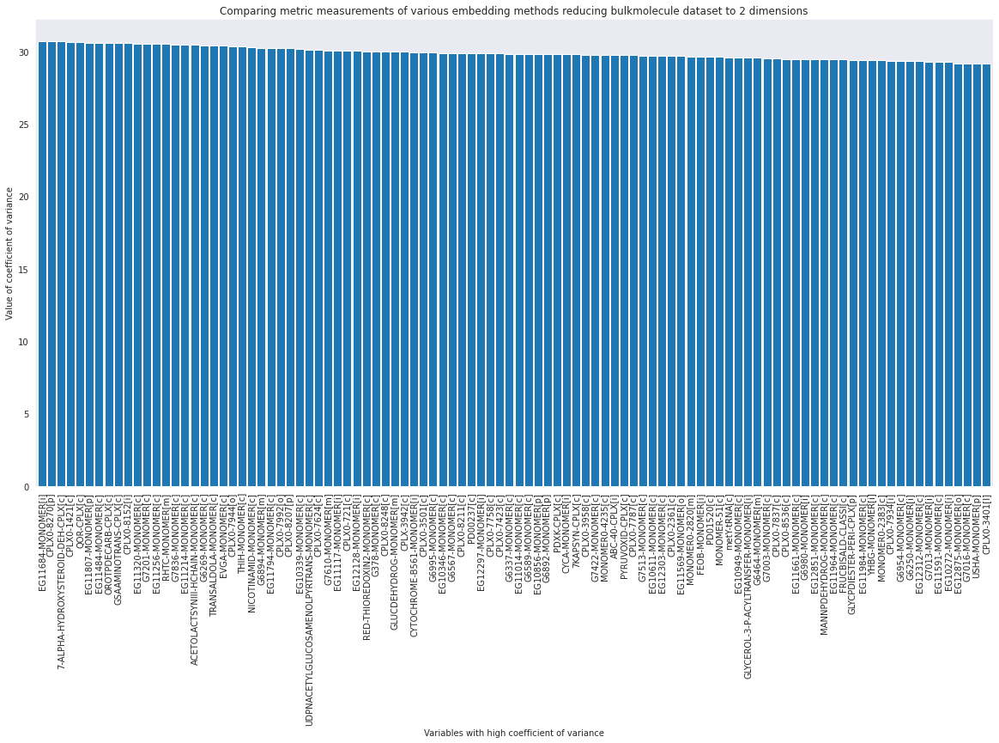

In [197]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [198]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4200:4300]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

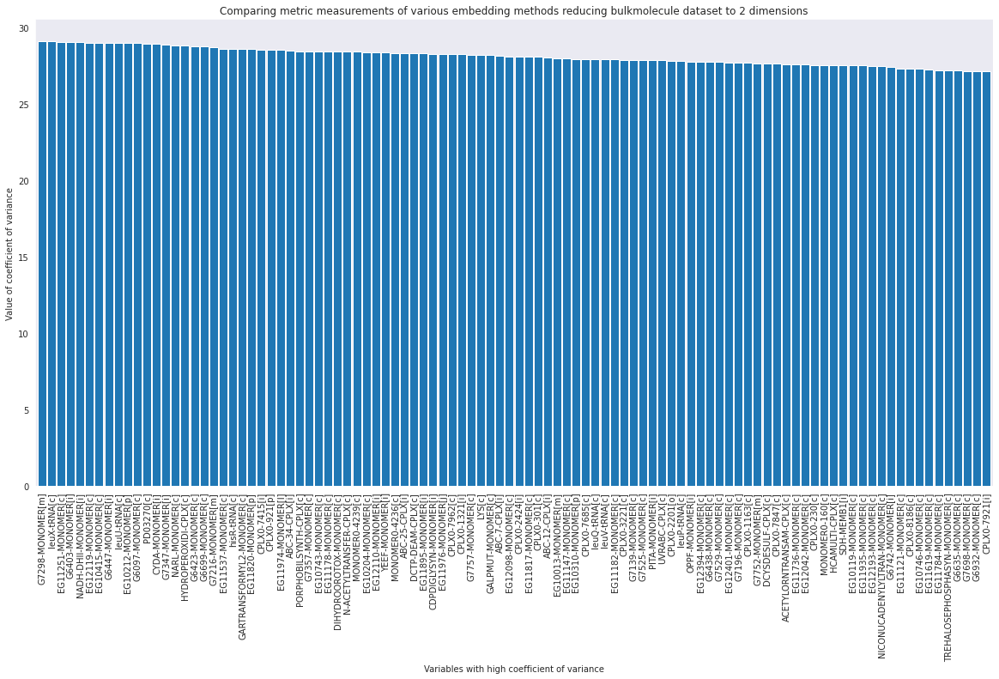

In [199]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [200]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4300:4400]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

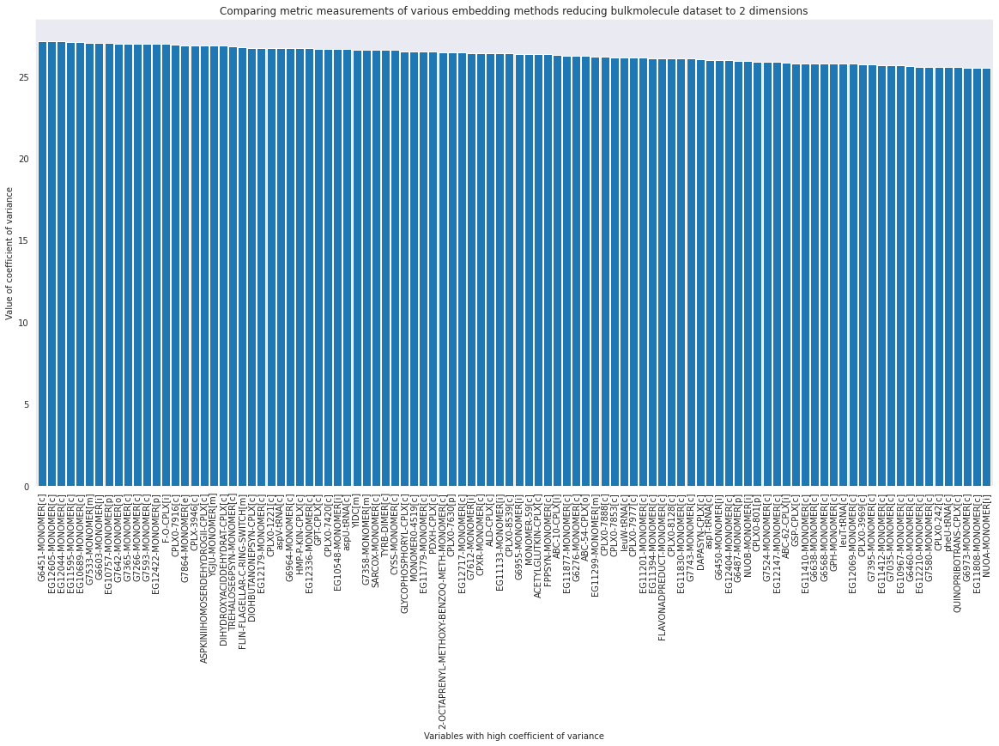

In [201]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [202]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4400:4500]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

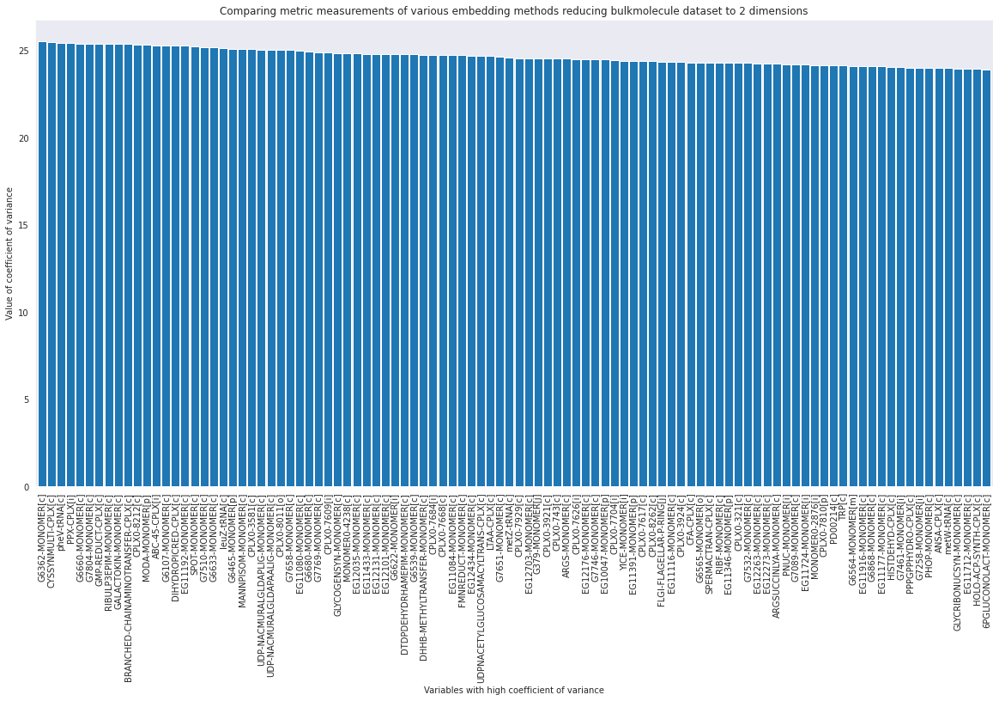

In [203]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [204]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4500:4600]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

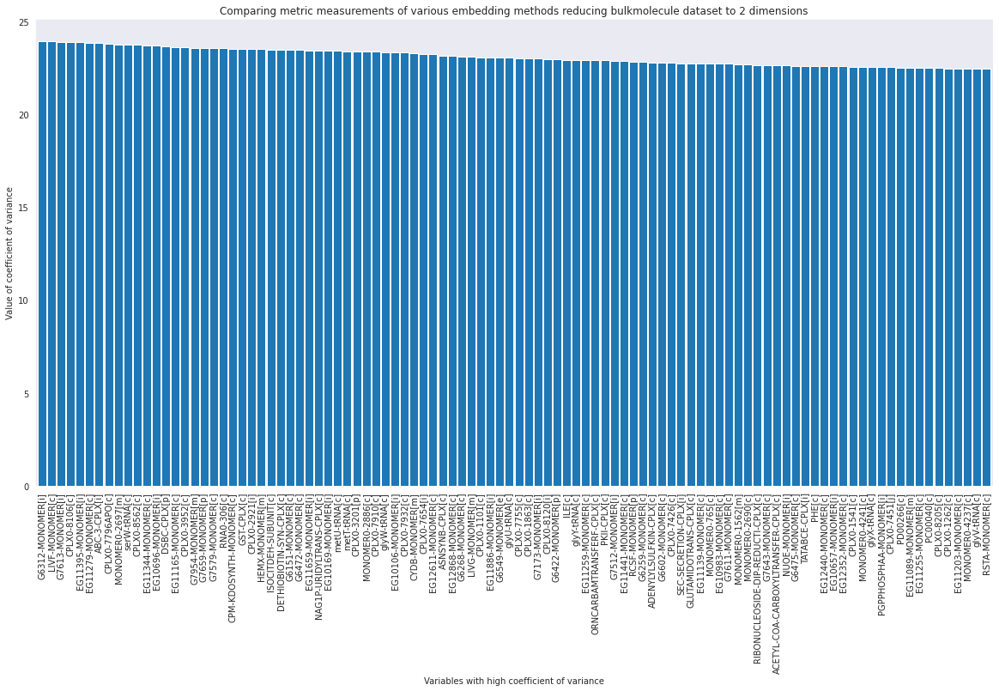

In [205]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [206]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4600:4700]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

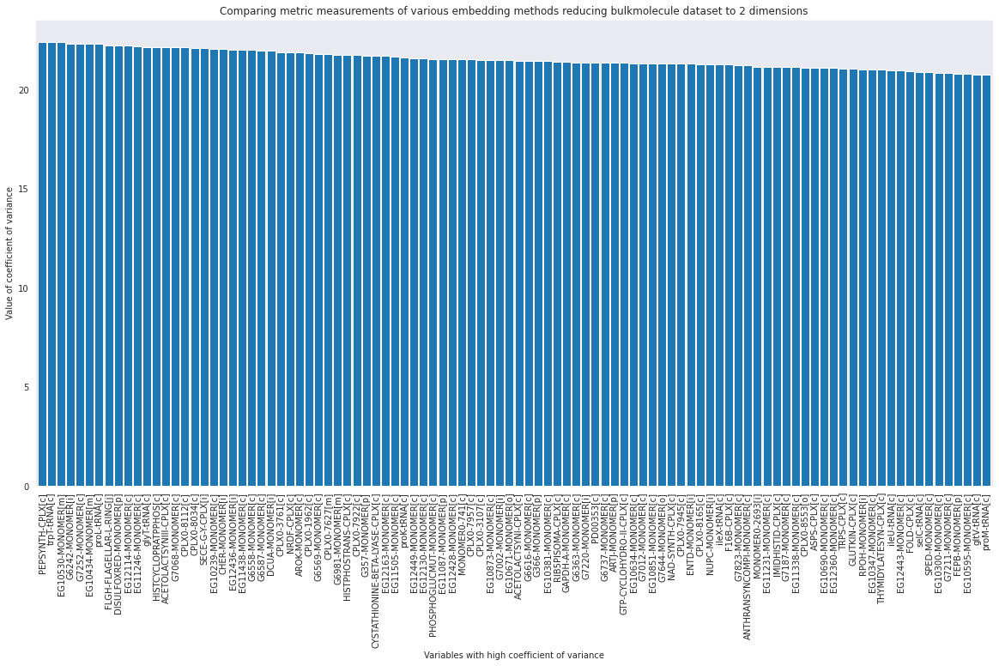

In [207]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [208]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4700:4800]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

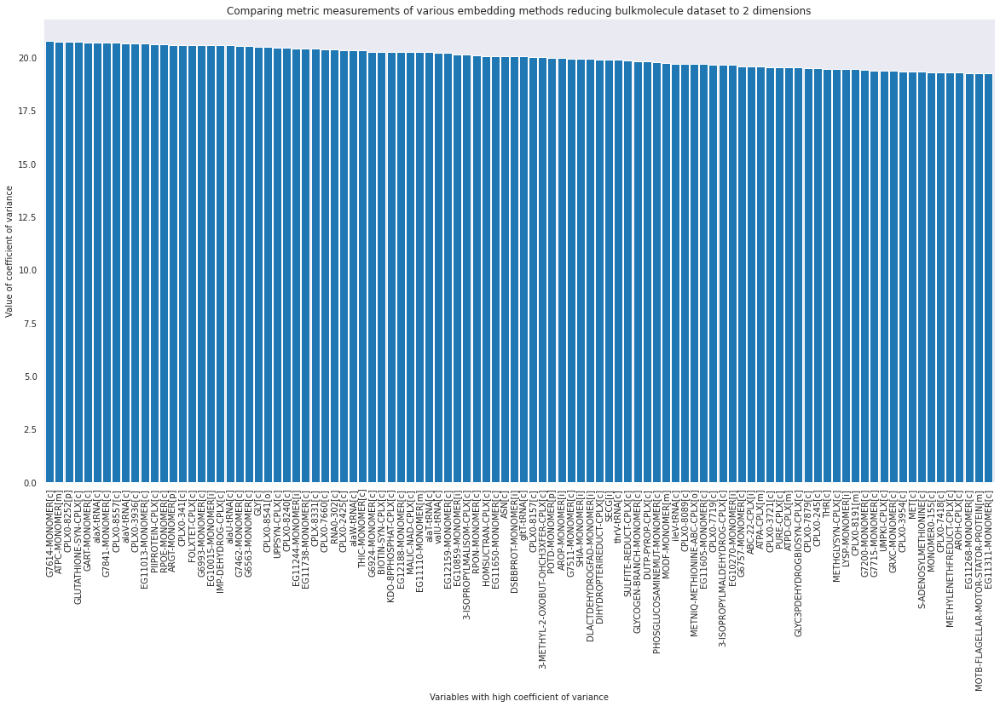

In [209]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [210]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4800:4900]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

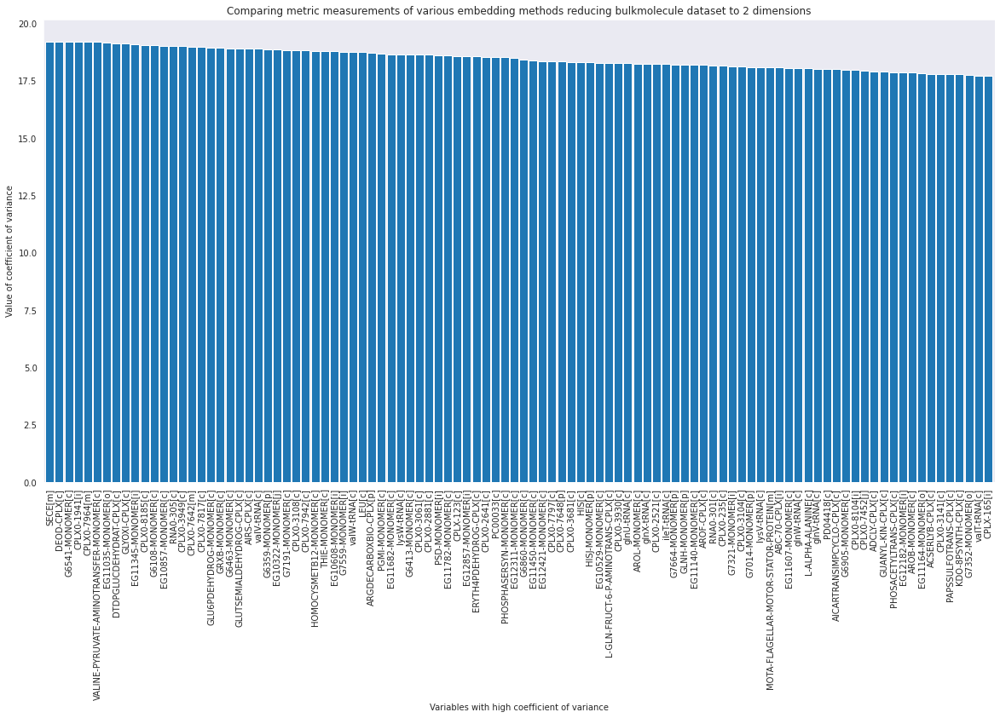

In [211]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [212]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 4900:5000]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

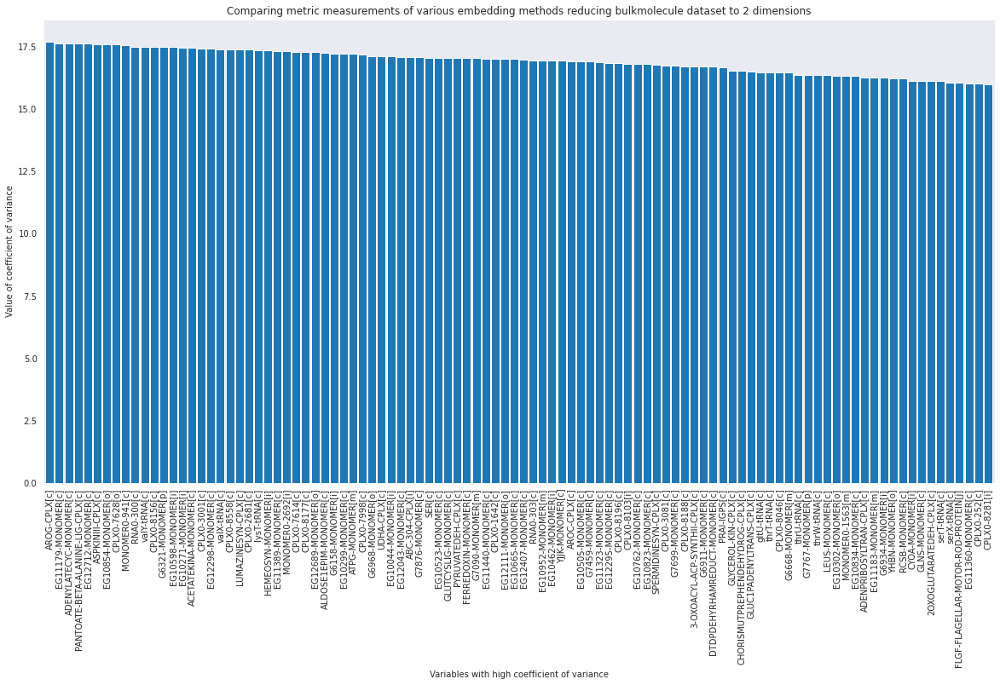

In [213]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [214]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 5000:5100]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

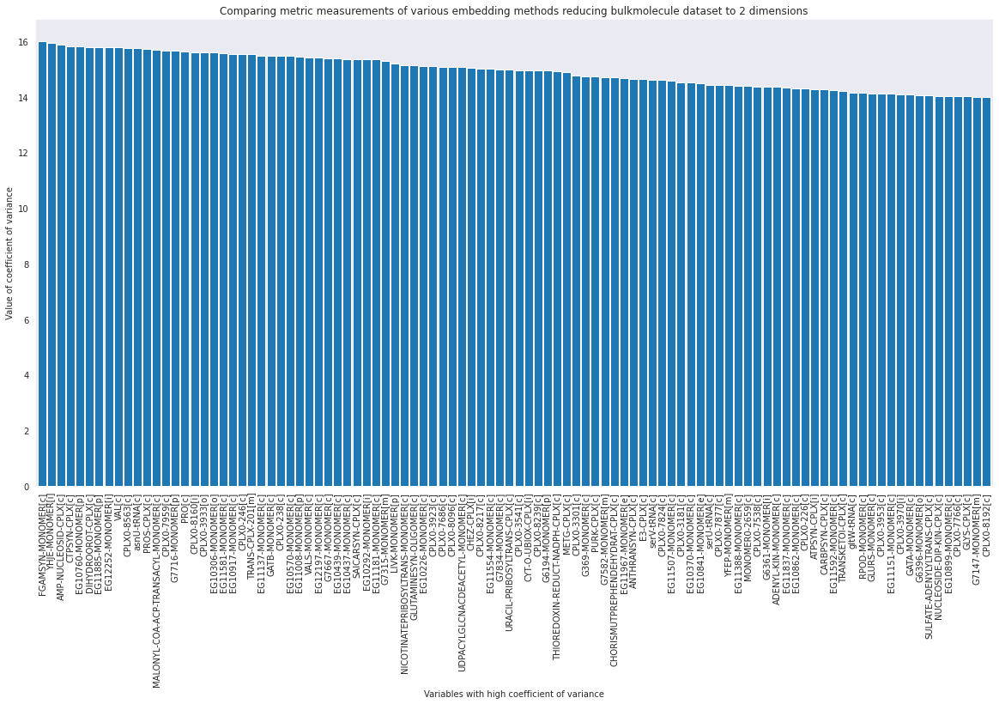

In [215]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [216]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 5100:5200]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

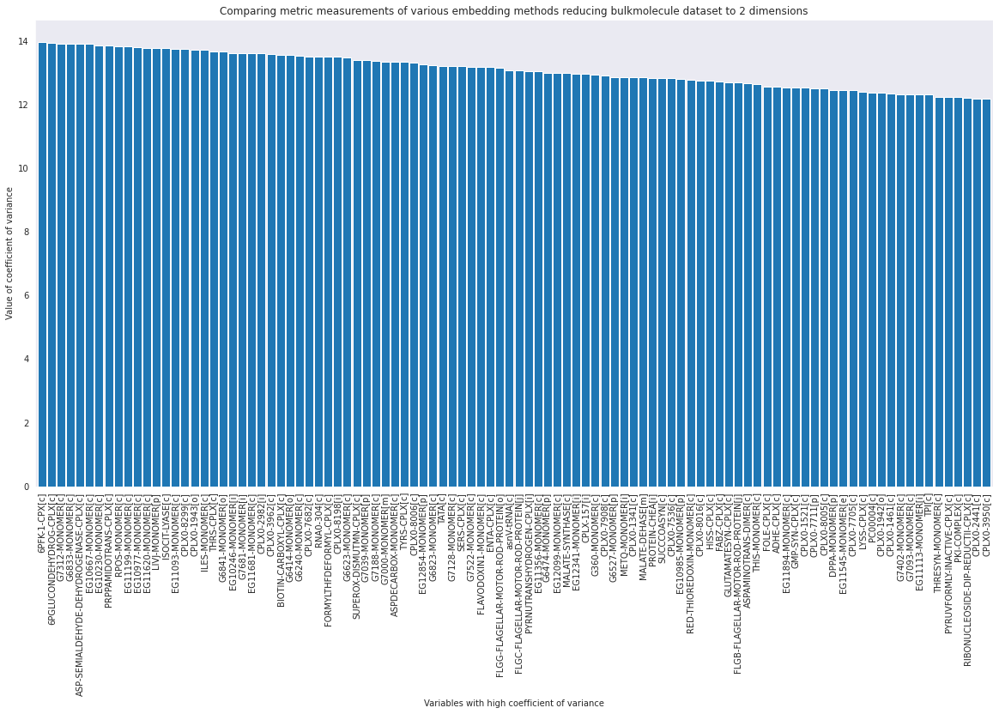

In [217]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [218]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 5200:5300]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

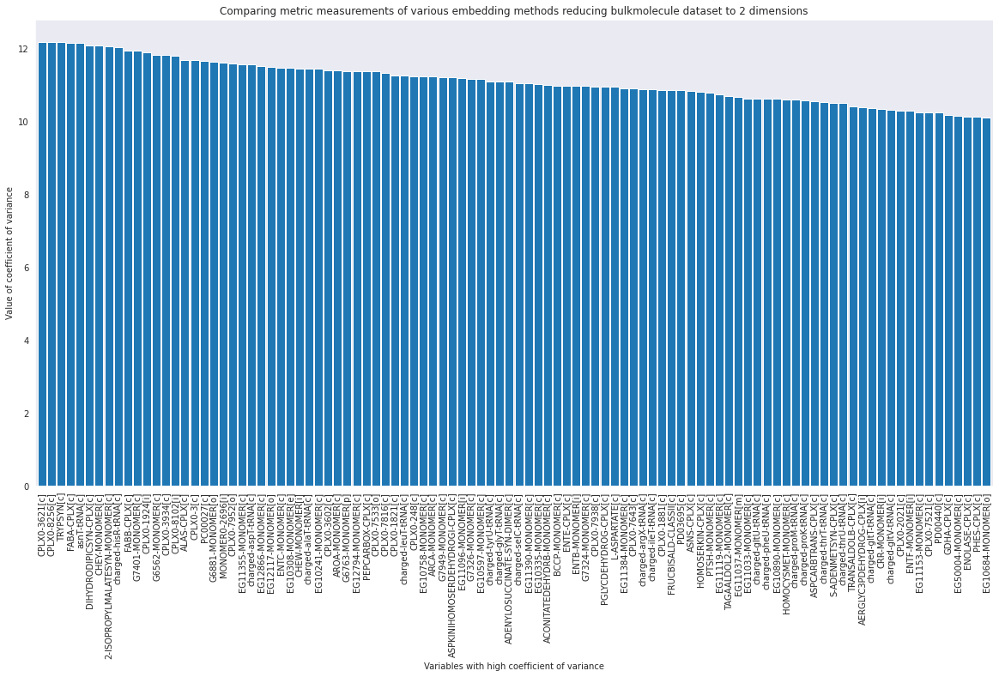

In [219]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [220]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 5300:5400]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

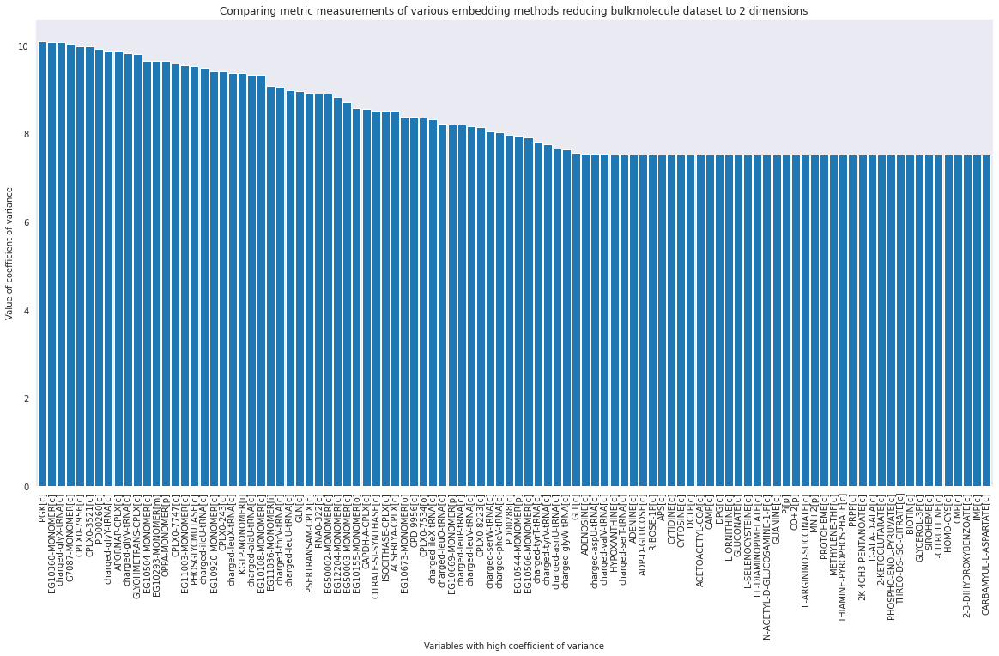

In [221]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [222]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 5400:5500]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

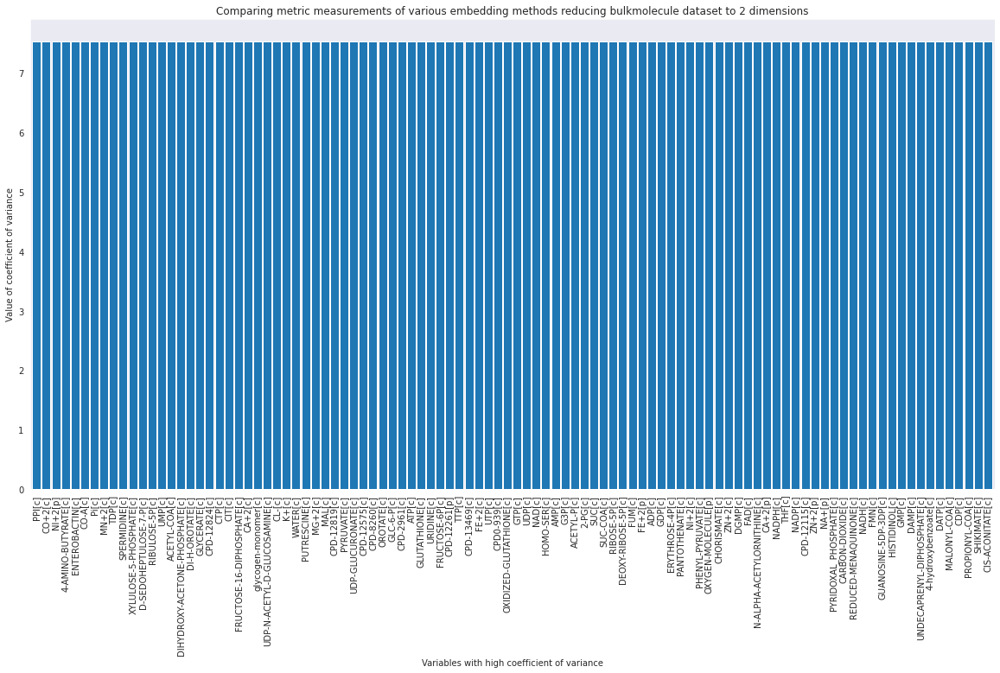

In [223]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [224]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 5500:5556]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)

Text(0, 0.5, 'Value of coefficient of variance')

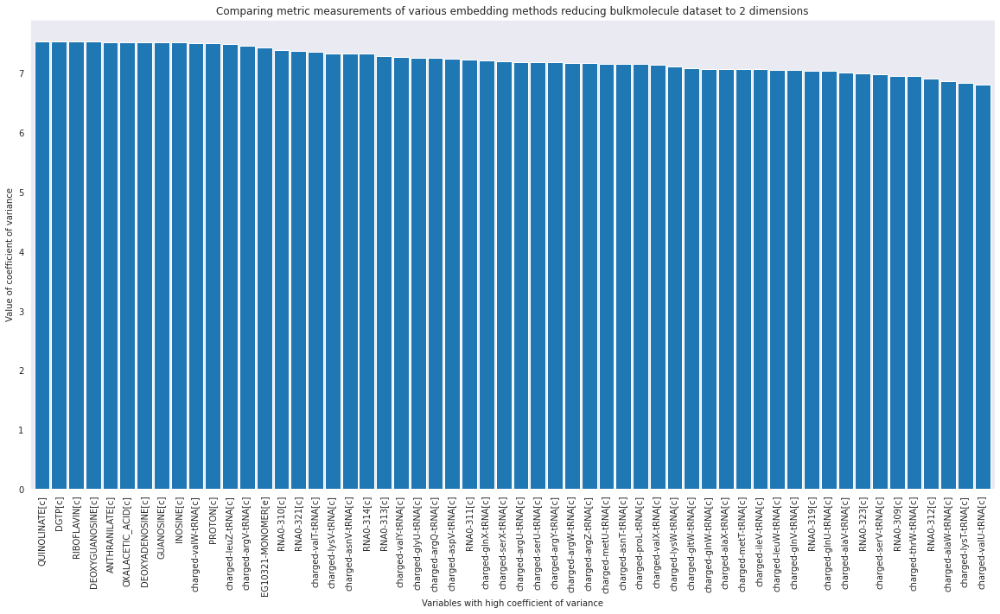

In [225]:
# plotting bar chart of first 50

import seaborn as sns
sns.set_style("dark")
g = variance1.plot(kind="bar", figsize=(20,10), width=0.9)
plt.title("Comparing metric measurements of various embedding methods reducing bulkmolecule dataset to 2 dimensions")
plt.xlabel("Variables with high coefficient of variance")
plt.ylabel("Value of coefficient of variance")

In [119]:
Newset1 = Big_data_set.reindex(cv1.sort_values(ascending=True).index, axis=1)
Data_set_reliable = Newset1.iloc[:, : 1423]
Data_set_reliable

,charged-valU-tRNA[c],charged-lysT-tRNA[c],charged-alaW-tRNA[c],RNA0-312[c],charged-thrW-tRNA[c],RNA0-309[c],charged-serV-tRNA[c],RNA0-323[c],charged-alaV-tRNA[c],charged-glnU-tRNA[c],...,EG10346-MONOMER[c],G6995-MONOMER[c],CPLX0-3501[c],CYTOCHROME-B561-MONOMER[i],CPLX-3942[c],GLUCDEHYDROG-MONOMER[m],CPLX0-8248[c],G378-MONOMER[c],RED-THIOREDOXIN2-MONOMER[c],EG12128-MONOMER[i]
0,2296,3030,2704,8799,5813,4484,8810,6897,6569,3098,...,621,658,388,1218,37,447,209,866,719,292
1,1939,2621,2276,7732,5061,3850,7872,5906,5715,2783,...,419,991,243,725,34,806,155,654,593,265
2,1979,2775,2407,7996,5327,4120,7989,6317,6205,2680,...,371,495,497,1055,60,951,148,821,511,289
3,2116,2827,2467,8058,5405,4081,8306,6334,6241,2894,...,558,719,316,1780,36,598,256,661,1180,320
4,2006,2673,2423,7974,5213,3865,7875,6297,5813,2768,...,537,375,216,1227,35,746,188,1199,966,360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2065,1899,2568,2334,7538,4873,3727,7512,5711,5720,2637,...,261,566,234,1926,29,474,135,572,661,264
2066,1936,2605,2261,7703,5029,3825,7594,5807,5634,2654,...,404,843,333,1036,38,348,103,415,978,403
2067,2069,2796,2446,7954,5119,3840,7946,6076,5965,2813,...,552,497,202,1142,27,739,155,1049,463,419
2068,1938,2604,2358,7513,4937,3736,7460,5735,5684,2663,...,318,891,257,1066,52,315,171,401,781,353


In [120]:
Data_set_reliable.to_csv('r\home\bonsai\wholecell3\cvreliabledataset.csv', index = False)

In [130]:
Data_set_reliable = Newset1.iloc[:, :5546]
Data_set_reliable
#calculate CV for each column in data frame
cv3 = Data_set_reliable.apply(cv)
cv3

charged-valU-tRNA[c]      6.814908
charged-lysT-tRNA[c]      6.839471
charged-alaW-tRNA[c]      6.860960
RNA0-312[c]               6.909922
charged-thrW-tRNA[c]      6.950882
                           ...    
CPLX0-8538[c]           898.211204
MONOMER0-4451[c]        904.652066
MONOMER0-4444[c]        923.532368
G7480-MONOMER[c]        943.626070
EMRB-MONOMER[i]         988.021191
Length: 5546, dtype: float64

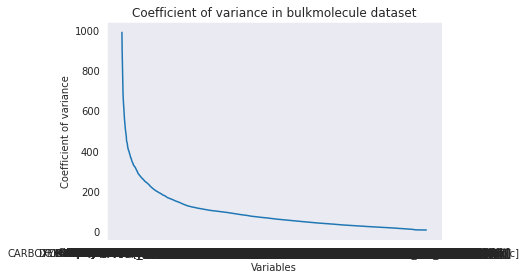

In [132]:
plt.plot(cv3.sort_values(ascending=False))
plt.title('Coefficient of variance in bulkmolecule dataset')
plt.xlabel('Variables')
plt.ylabel('Coefficient of variance')
plt.show()

In [145]:
Data_set_reliable = Newset1.iloc[:, :1423]
Data_set_reliable
#calculate CV for each column in data frame
cv3 = Data_set_reliable.apply(cv)
cv3

charged-valU-tRNA[c]            6.814908
charged-lysT-tRNA[c]            6.839471
charged-alaW-tRNA[c]            6.860960
RNA0-312[c]                     6.909922
charged-thrW-tRNA[c]            6.950882
                                 ...    
GLUCDEHYDROG-MONOMER[m]        29.947728
CPLX0-8248[c]                  29.955744
G378-MONOMER[c]                29.977951
RED-THIOREDOXIN2-MONOMER[c]    29.994930
EG12128-MONOMER[i]             30.016990
Length: 1423, dtype: float64

In [238]:
max_variances3 = Data_set_reliable.var()
#max_variances.sort_values(ascending=False).head(50)
max_variances3

charged-valU-tRNA[c]            19550.353089
charged-lysT-tRNA[c]            35984.275874
charged-alaW-tRNA[c]            27433.222865
RNA0-312[c]                    310445.116572
charged-thrW-tRNA[c]           132687.971272
                                   ...      
GLUCDEHYDROG-MONOMER[m]         32120.355662
CPLX0-8248[c]                    2241.190979
G378-MONOMER[c]                 43917.181831
RED-THIOREDOXIN2-MONOMER[c]     65463.936617
EG12128-MONOMER[i]              10604.945790
Length: 1423, dtype: float64

In [233]:
max_variances = Big_data_set.var()
#max_variances.sort_values(ascending=False).head(50)
max_variances

1-ACYLGLYCEROL-3-P-ACYLTRANSFER-MONOMER[i]    5.012562e+03
1-PFK[c]                                      7.889398e+02
1-PFK-MONOMER[c]                              3.420365e-01
2-3-DIHYDROXYBENZOATE[c]                      1.616992e+08
2-DEHYDROPANTOATE-REDUCT-MONOMER[c]           1.215510e+04
                                                  ...     
valU-tRNA[c]                                  1.951444e+01
valV-tRNA[c]                                  1.657751e+01
valW-tRNA[c]                                  4.359672e+01
valX-tRNA[c]                                  9.215687e+01
valY-tRNA[c]                                  1.271255e+02
Length: 5556, dtype: float64

In [231]:
#Newset = Big_data_set.reindex(cv1.sort_values(ascending=True).index, axis=1)
cv2 = Big_data_set.apply(cv)
#variance1 = cv2.sort_values(ascending=True)
cv2

1-ACYLGLYCEROL-3-P-ACYLTRANSFER-MONOMER[i]    30.953161
1-PFK[c]                                      52.198469
1-PFK-MONOMER[c]                              99.557268
2-3-DIHYDROXYBENZOATE[c]                       7.528936
2-DEHYDROPANTOATE-REDUCT-MONOMER[c]           35.834736
                                                ...    
valU-tRNA[c]                                  20.208300
valV-tRNA[c]                                  18.895826
valW-tRNA[c]                                  18.741440
valX-tRNA[c]                                  17.413411
valY-tRNA[c]                                  17.493842
Length: 5556, dtype: float64

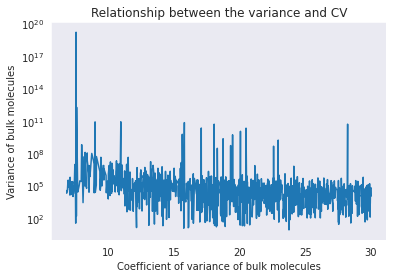

In [239]:
plt.plot(cv3, max_variances3)
plt.yscale("log")
plt.title('Relationship between the variance and CV')
plt.xlabel('Coefficient of variance of bulk molecules')
plt.ylabel('Variance of bulk molecules')
plt.show()

In [250]:
Newset3 = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set_reliable1 = Newset3.iloc[:, :1752]
cv4 = Data_set_reliable1.apply(cv)
cv4

FDNG-MONOMER[p]                       4549.725266
E1O[c]                                4549.725266
FORMATEDEHYDROGN-CPLX[i]              4549.725266
MONOMER0-5[i]                         3596.352067
YBBP-MONOMER[i]                       2211.191115
                                         ...     
G6662-MONOMER[c]                       100.127346
ARAH-MONOMER[i]                        100.105015
EG11692-MONOMER[c]                     100.034337
G6112-MONOMER[c]                       100.022392
LIPIDADISACCHARIDESYNTH-MONOMER[i]     100.018279
Length: 1752, dtype: float64

In [251]:
max_variances4 = Data_set_reliable1.var()
#max_variances.sort_values(ascending=False).head(50)
max_variances4

FDNG-MONOMER[p]                          0.004348
E1O[c]                                   0.108696
FORMATEDEHYDROGN-CPLX[i]                 0.000483
MONOMER0-5[i]                            0.004830
YBBP-MONOMER[i]                         10.824636
                                         ...     
G6662-MONOMER[c]                         0.277473
ARAH-MONOMER[i]                       5384.038617
EG11692-MONOMER[c]                       0.289300
G6112-MONOMER[c]                      6118.432471
LIPIDADISACCHARIDESYNTH-MONOMER[i]       0.253972
Length: 1752, dtype: float64

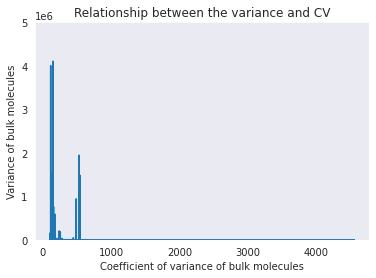

In [273]:
plt.plot(cv4, max_variances4)
plt.ylim(0, 5000000)
plt.title('Relationship between the variance and CV')
plt.xlabel('Coefficient of variance of bulk molecules')
plt.ylabel('Variance of bulk molecules')
plt.show()

In [304]:
Newset3 = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set_reliable1 = Newset3.iloc[:, :]
cv4 = Data_set_reliable1.apply(cv)
cv4

FDNG-MONOMER[p]             4549.725266
E1O[c]                      4549.725266
FORMATEDEHYDROGN-CPLX[i]    4549.725266
MONOMER0-5[i]               3596.352067
YBBP-MONOMER[i]             2211.191115
                               ...     
charged-thrW-tRNA[c]           6.950882
RNA0-312[c]                    6.909922
charged-alaW-tRNA[c]           6.860960
charged-lysT-tRNA[c]           6.839471
charged-valU-tRNA[c]           6.814908
Length: 5556, dtype: float64

In [325]:
max_variances4 = Data_set_reliable1.var()
#max_variances.sort_values(ascending=False).head(50)
max_variances4

FDNG-MONOMER[p]                  0.004348
E1O[c]                           0.108696
FORMATEDEHYDROGN-CPLX[i]         0.000483
MONOMER0-5[i]                    0.004830
YBBP-MONOMER[i]                 10.824636
                                ...      
charged-thrW-tRNA[c]        132687.971272
RNA0-312[c]                 310445.116572
charged-alaW-tRNA[c]         27433.222865
charged-lysT-tRNA[c]         35984.275874
charged-valU-tRNA[c]         19550.353089
Length: 5556, dtype: float64

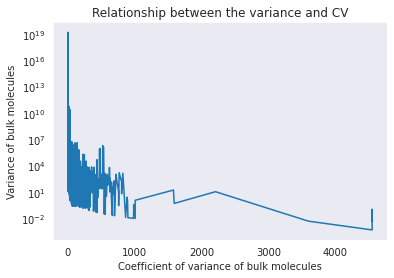

In [307]:
plt.plot(cv4, max_variances4)
plt.yscale("log")
plt.title('Relationship between the variance and CV')
plt.xlabel('Coefficient of variance of bulk molecules')
plt.ylabel('Variance of bulk molecules')
plt.show()

In [413]:
max_variances4 = Data_set_reliable1.var()
max_variances.sort_values(ascending=False).head(50)
max_variances4 = np.log(max_variances4)

In [414]:
datavariance = pd.DataFrame(max_variances4)
datacv = pd.DataFrame(cv4)

In [415]:
datavariance.columns = ['variance']
datavariance

,variance
FDNG-MONOMER[p],-5.438079
E1O[c],-2.219203
FORMATEDEHYDROGN-CPLX[i],-7.635304
MONOMER0-5[i],-5.333009
YBBP-MONOMER[i],2.381825
XANTHOSINEPHOSPHORY-CPLX[c],-0.687930
G6529-MONOMER[i],2.814828
CPLX0-7697[c],0.138282
PHOR-CPLX[c],-4.648797
PHOSPHO-PHOB[c],-0.980559


In [416]:
datacv.columns = ['cv']
datacv

,cv
FDNG-MONOMER[p],4549.725266
E1O[c],4549.725266
FORMATEDEHYDROGN-CPLX[i],4549.725266
MONOMER0-5[i],3596.352067
YBBP-MONOMER[i],2211.191115
XANTHOSINEPHOSPHORY-CPLX[c],1595.145790
G6529-MONOMER[i],1583.657421
CPLX0-7697[c],1012.869995
PHOR-CPLX[c],1012.667472
PHOSPHO-PHOB[c],990.455076


In [417]:
column1 = datavariance['variance']
column2 = datacv['cv']
correlation = column2.corr(column1)
correlation

-0.27863341634687216

In [418]:
dataspear = pd.concat([column1, column2],axis =1)
dataspear

correlationspear = dataspear.corr(method = 'spearman')
correlationspear

,variance,cv
variance,1.000000,-0.597833
cv,-0.597833,1.000000


In [419]:
cv4.sort_values(ascending=False).head(50)

FDNG-MONOMER[p]                          4549.725266
E1O[c]                                   4549.725266
FORMATEDEHYDROGN-CPLX[i]                 4549.725266
MONOMER0-5[i]                            3596.352067
YBBP-MONOMER[i]                          2211.191115
XANTHOSINEPHOSPHORY-CPLX[c]              1595.145790
G6529-MONOMER[i]                         1583.657421
CPLX0-7697[c]                            1012.869995
PHOR-CPLX[c]                             1012.667472
PHOSPHO-PHOB[c]                           990.455076
EMRB-MONOMER[i]                           988.021191
G7480-MONOMER[c]                          943.626070
MONOMER0-4444[c]                          923.532368
MONOMER0-4451[c]                          904.652066
CPLX0-8538[c]                             898.211204
CPLX0-7836[c]                             890.872498
MONOMER0-4449[c]                          870.076079
YLIC-MONOMER[i]                           855.144150
HRSA-MONOMER[i]                           828.

In [420]:
max_variances4 = Data_set_reliable1.var()
max_variances4.sort_values(ascending=True).head(50)

FORMATEDEHYDROGN-CPLX[i]      0.000483
FDNG-MONOMER[p]               0.004348
MONOMER0-5[i]                 0.004830
PHOR-CPLX[c]                  0.009573
EMRB-MONOMER[i]               0.010047
G7480-MONOMER[c]              0.010993
MONOMER0-4444[c]              0.011465
MONOMER0-4451[c]              0.011937
MONOMER0-4449[c]              0.012880
MONOMER0-4448[c]              0.019424
MONOMER0-4440[c]              0.019424
EG10484-MONOMER[c]            0.021277
EG11071-MONOMER[c]            0.029523
G6138-MONOMER[c]              0.030882
CPLX0-2141[i]                 0.046434
MONOMER0-4446[c]              0.047305
PD01896[c]                    0.050875
G7385-MONOMER[c]              0.063052
CPLX0-8167[i]                 0.079034
G7777-MONOMER[c]              0.083975
G7244-MONOMER[c]              0.089024
EG11088-MONOMER[c]            0.089050
E1O[c]                        0.108696
G6727-MONOMER[i]              0.134621
ALPHA-SUBUNIT-CPLX[i]         0.139082
CPLX0-7935[c]            

In [421]:
Data_set_reliable1 = Newset3.iloc[:, :1752]
mean = Data_set_reliable1.mean(axis=0)
mean

FDNG-MONOMER[p]                              0.001449
E1O[c]                                       0.007246
FORMATEDEHYDROGN-CPLX[i]                     0.000483
MONOMER0-5[i]                                0.001932
YBBP-MONOMER[i]                              0.148792
XANTHOSINEPHOSPHORY-CPLX[c]                  0.044444
G6529-MONOMER[i]                             0.257971
CPLX0-7697[c]                                0.105797
PHOR-CPLX[c]                                 0.009662
PHOSPHO-PHOB[c]                              0.061836
EMRB-MONOMER[i]                              0.010145
G7480-MONOMER[c]                             0.011111
MONOMER0-4444[c]                             0.011594
MONOMER0-4451[c]                             0.012077
CPLX0-8538[c]                                0.114976
CPLX0-7836[c]                                0.181159
MONOMER0-4449[c]                             0.013043
YLIC-MONOMER[i]                              0.098068
HRSA-MONOMER[i]             

In [422]:
max_variances5 = Data_set_reliable1.var()
max_variances5

FDNG-MONOMER[p]                           4.347826e-03
E1O[c]                                    1.086957e-01
FORMATEDEHYDROGN-CPLX[i]                  4.830918e-04
MONOMER0-5[i]                             4.829517e-03
YBBP-MONOMER[i]                           1.082464e+01
XANTHOSINEPHOSPHORY-CPLX[c]               5.026153e-01
G6529-MONOMER[i]                          1.669031e+01
CPLX0-7697[c]                             1.148299e+00
PHOR-CPLX[c]                              9.573109e-03
PHOSPHO-PHOB[c]                           3.751015e-01
EMRB-MONOMER[i]                           1.004686e-02
G7480-MONOMER[c]                          1.099296e-02
MONOMER0-4444[c]                          1.146532e-02
MONOMER0-4451[c]                          1.193720e-02
CPLX0-8538[c]                             1.066523e+00
CPLX0-7836[c]                             2.604671e+00
MONOMER0-4449[c]                          1.287957e-02
YLIC-MONOMER[i]                           7.032829e-01
HRSA-MONOM

In [8]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [424]:
Newset3 = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set_reliable1 = Newset3.iloc[:, :]
cv4 = Data_set_reliable1.apply(cv)
max_variances4 = Data_set_reliable1.var()
meandata = Data_set_reliable1.mean()
std = Data_set_reliable1.std()

CVdataset = pd.concat([cv4, max_variances4, meandata, std],axis =1)
CVdataset.columns = ['CV','Variance','Mean','Std']
CVdataset

,CV,Variance,Mean,Std
FDNG-MONOMER[p],4549.725266,4.347826e-03,1.449275e-03,6.593805e-02
E1O[c],4549.725266,1.086957e-01,7.246377e-03,3.296902e-01
FORMATEDEHYDROGN-CPLX[i],4549.725266,4.830918e-04,4.830918e-04,2.197935e-02
MONOMER0-5[i],3596.352067,4.829517e-03,1.932367e-03,6.949473e-02
YBBP-MONOMER[i],2211.191115,1.082464e+01,1.487923e-01,3.290081e+00
XANTHOSINEPHOSPHORY-CPLX[c],1595.145790,5.026153e-01,4.444444e-02,7.089537e-01
G6529-MONOMER[i],1583.657421,1.669031e+01,2.579710e-01,4.085377e+00
CPLX0-7697[c],1012.869995,1.148299e+00,1.057971e-01,1.071587e+00
PHOR-CPLX[c],1012.667472,9.573109e-03,9.661836e-03,9.784227e-02
PHOSPHO-PHOB[c],990.455076,3.751015e-01,6.183575e-02,6.124553e-01


In [425]:
correlationspear = CVdataset.corr(method = 'spearman')
correlationspear

,CV,Variance,Mean,Std
CV,1.000000,-0.597833,-0.787736,-0.597833
Variance,-0.597833,1.000000,0.953619,1.000000
Mean,-0.787736,0.953619,1.000000,0.953619
Std,-0.597833,1.000000,0.953619,1.000000


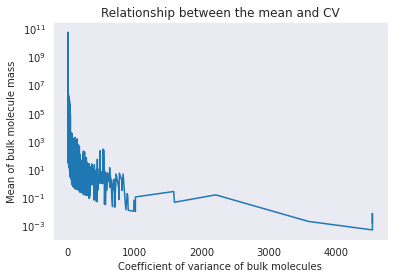

In [393]:
plt.plot(cv4, meandata)
plt.yscale("log")
plt.title('Relationship between the mean and CV')
plt.xlabel('Coefficient of variance of bulk molecules')
plt.ylabel('Mean of bulk molecule mass')
plt.show()

In [412]:
mean2 = Big_data_set.mean(axis=0)
mean2.sort_values(ascending=True).astype('int')

FORMATEDEHYDROGN-CPLX[i]                                 0
FDNG-MONOMER[p]                                          0
MONOMER0-5[i]                                            0
E1O[c]                                                   0
PHOR-CPLX[c]                                             0
EMRB-MONOMER[i]                                          0
G7480-MONOMER[c]                                         0
MONOMER0-4444[c]                                         0
MONOMER0-4451[c]                                         0
MONOMER0-4449[c]                                         0
MONOMER0-4440[c]                                         0
MONOMER0-4448[c]                                         0
EG10484-MONOMER[c]                                       0
EG11071-MONOMER[c]                                       0
G6138-MONOMER[c]                                         0
XANTHOSINEPHOSPHORY-CPLX[c]                              0
CPLX0-2141[i]                                           

In [14]:
Newset = Big_data_set.reindex(cv1.sort_values(ascending=False).index, axis=1)
Data_set = Newset.iloc[:, 1700:1753]
cv2 = Data_set.apply(cv)
variance1 = cv2.sort_values(ascending=False)
variance1

G6953-MONOMER[i]                      101.621751
CPLX0-7835[c]                         101.589794
YADQ-MONOMER[i]                       101.537696
ALPHAGALACTOSID-MONOMER[c]            101.508924
MONOMER0-341[o]                       101.506253
ASNSYNB-MONOMER[c]                    101.470453
EG10695-MONOMER[c]                    101.465425
RIBULOKIN-MONOMER[c]                  101.453194
EG10240-MONOMER[m]                    101.379054
KDGT-MONOMER[i]                       101.297418
EG12409-MONOMER[c]                    101.230567
EG10201-MONOMER[p]                    101.205298
XYLISOM-MONOMER[c]                    101.190665
YDCS-MONOMER[p]                       101.063165
EG12258-MONOMER[e]                    101.038822
EG10395-MONOMER[c]                    101.004926
G6198-MONOMER[c]                      100.995295
G6681-MONOMER[c]                      100.992041
EG11888-MONOMER[c]                    100.962100
EG11261-MONOMER[c]                    100.919418
NARX-MONOMER[i]     